<a href="https://colab.research.google.com/github/nicolelnunes/MasterThesis/blob/main/PlanAPP2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install transformers
!pip install sentence_transformers
!pip install pyLDAvis
!pip install gensim
!pip install numpy
!pip install torch
!pip install torchvision


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 50.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.9/27.9 MB 93.7 MB/s eta 0:00:00


In [ ]:
import numpy as np
from gensim.corpora import Dictionary
from gensim.models.coherencemodel import CoherenceModel
from sentence_transformers import SentenceTransformer

# Imports

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import numpy as np
import matplotlib.pyplot as plt
import json
import os
import re


Mounted at /content/drive


# Load Data

In [ ]:
def load_json_files(folder_path):
  loaded_docs = {}

  for filename in os.listdir(folder_path):
      if filename.endswith(".json"):  # Only load JSON files
          full_path = os.path.join(folder_path, filename)
          with open(full_path, "r", encoding="utf-8") as f:
              doc_name = filename.replace(".json", "")
              loaded_docs[doc_name] = json.load(f)

  return loaded_docs

In [ ]:
topics_folder = load_json_files("/content/drive/MyDrive/Data/topic_words/")
docs_folder = load_json_files("/content/drive/MyDrive/Data/docs/")

In [ ]:
def count_tokens(docs_folder):
  for processing_step, docs in docs_folder.items():
    total_docs = len(docs)
    total_tokens = sum(len(token) for token in docs)
    print(f"{processing_step}: {total_tokens} tokens")
    print(f"Total docs: {total_docs}")

count_tokens(docs_folder)

simple_docs: 10665 tokens
Total docs: 1810
normal_docs: 7377 tokens
Total docs: 1810
no_preprocessing_docs: 11636 tokens
Total docs: 1810
total_docs: 7377 tokens
Total docs: 1810
pt_total_preprocessing_docs: 7460 tokens
Total docs: 1810
pt_normal_preprocessing_docs: 7452 tokens
Total docs: 1810


# Evaluate BERT

In [ ]:
def calculate_coherence(topic_words, docs, metric):

  if all(isinstance(item, str) for item in docs):  # Check if 'docs' contains only strings
    docs = [doc.split() for doc in docs]

  dictionary = Dictionary(docs)

  coherence_model = CoherenceModel(
  topics=topic_words,
  texts=docs,
  dictionary=dictionary,
  coherence= metric
  )

  coherence_score = coherence_model.get_coherence()
  return coherence_score


def run_coherence_calculation(topics_folder, docs_folder, metric):
  scores = {}
  for name, words in topics_folder.items():
    doc_preprocessing = name.split('__')[0]
    doc_key = f"{doc_preprocessing}_docs"

    if doc_key in docs_folder:
      score = calculate_coherence(words, docs_folder[doc_key], metric)
      scores[name] = score
    else:
      print(f"Warning: {doc_key} not found in docs_folder.")
  return scores

In [ ]:
# from sklearn.feature_extraction.text import TfidfVectorizer
# from sklearn.metrics.pairwise import cosine_similarity
# import numpy as np

# def calculate_coherence(topic_words, docs):
#     if all(isinstance(doc, str) for doc in docs):
#         docs = [doc.split() for doc in docs]

#     # Flatten list of tokens back to documents for TF-IDF
#     docs_text = [' '.join(doc) for doc in docs]

#     vectorizer = TfidfVectorizer()
#     tfidf_matrix = vectorizer.fit_transform(docs_text)
#     feature_names = vectorizer.get_feature_names_out()

#     # Filter to vectors of topic words only (if they exist in vocab)
#     word_indices = [vectorizer.vocabulary_.get(word) for word in topic_words if word in vectorizer.vocabulary_]
#     word_indices = [i for i in word_indices if i is not None]

#     if len(word_indices) < 2:
#         return 0.0  # Not enough words to compute coherence

#     # Get the TF-IDF vectors for the topic words
#     topic_vectors = tfidf_matrix[:, word_indices].T.toarray()

#     # Compute average pairwise cosine similarity
#     similarities = []
#     for i in range(len(topic_vectors)):
#         for j in range(i + 1, len(topic_vectors)):
#             sim = cosine_similarity([topic_vectors[i]], [topic_vectors[j]])[0][0]
#             similarities.append(sim)

#     if not similarities:
#         return 0.0

#     return np.mean(similarities)

# def run_coherence_calculation(topics_folder, docs_folder):
#     scores = {}
#     for name, words in topics_folder.items():
#         doc_preprocessing = name.split('__')[0]
#         doc_key = f"{doc_preprocessing}_docs"

#         if doc_key in docs_folder:
#             score = calculate_coherence(words, docs_folder[doc_key])
#             scores[name] = score
#         else:
#             print(f"Warning: {doc_key} not found in docs_folder.")
#     return scores

In [ ]:
coherence_scores_cv = run_coherence_calculation(topics_folder, docs_folder, "c_v")
coherence_scores_umass = run_coherence_calculation(topics_folder, docs_folder, "u_mass")

In [ ]:
def create_dictionaries(coherence_scores):
  dicts = {}
  for key, value in coherence_scores.items():
    name = key.split('__')
    new_dict_name =("_").join(name[:2])
    if new_dict_name not in dicts:  # Check if the category exists in dicts
      dicts[new_dict_name] = {}  # Create a new dictionary for the category
    dicts[new_dict_name][key] = value
  return dicts


dictionaries_cv =create_dictionaries(coherence_scores_cv)
dictionaries_umass =create_dictionaries(coherence_scores_umass)


In [ ]:
def get_coherence_graphs(dictionaries):
    plt.figure(figsize=(10, 6))

    for label, data in dictionaries.items():
        # Filter out invalid/empty sub-dictionaries
        if not isinstance(data, dict) or not data:
            continue

        x = []
        y = []

        for k, v in data.items():
            # Extract number of topics using regex
            match = re.search(r"__(\d+)_topic_words", k)
            if match:
                x.append(int(match.group(1)))
                y.append(v)

        # Sort by number of topics
        sorted_pairs = sorted(zip(x, y))
        x_sorted, y_sorted = zip(*sorted_pairs)

        plt.plot(x_sorted, y_sorted, marker='o', label=label)

    plt.xlabel("Number of Topics")
    plt.ylabel("Coherence Score")
    plt.title("Coherence Scores by Number of Topics")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

## Coherence Graphs

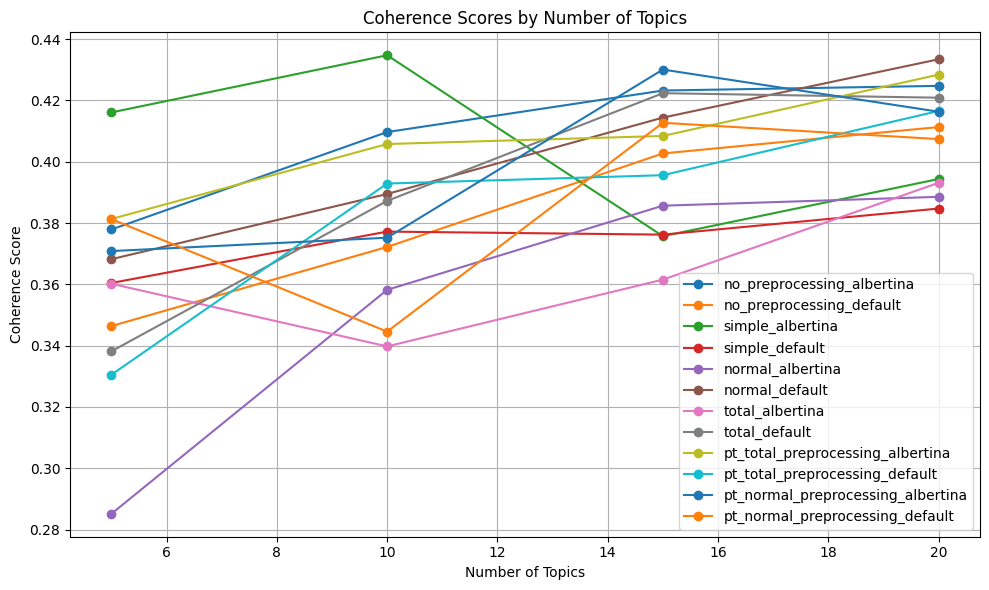

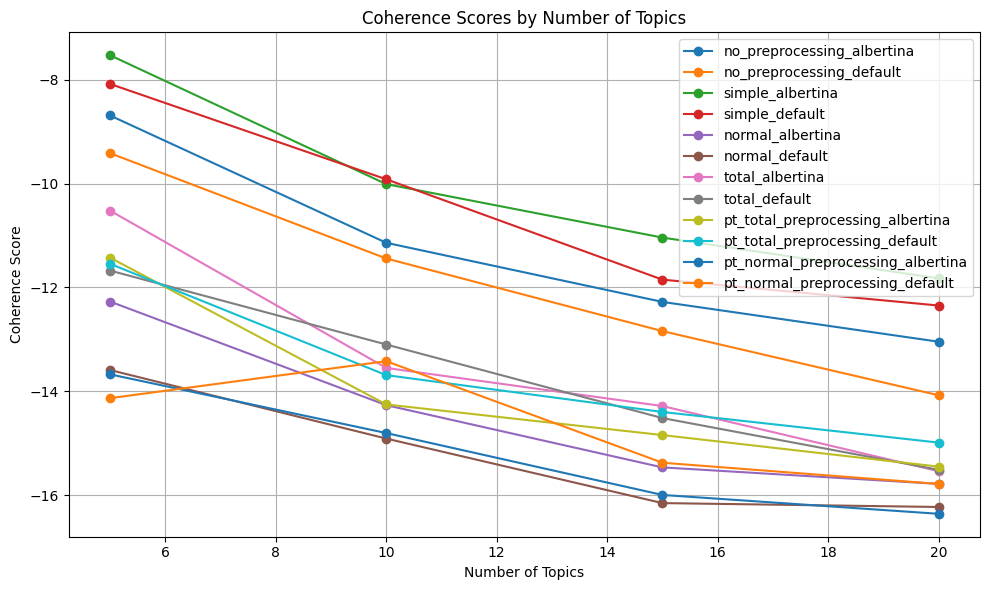

In [ ]:
get_coherence_graphs(dictionaries_cv)
get_coherence_graphs(dictionaries_umass)

In [ ]:
def get_coherence_graphs_by_model(dictionaries):
    models = ["default", "albertina"]
    fig, axes = plt.subplots(ncols=2, figsize=(14, 5), sharey=True)

    for i, model in enumerate(models):
        ax = axes[i]
        for key, data in dictionaries.items():
            if key.endswith(model):
                preprocessing = key.replace(f"_{model}", "")
                x = []
                y = []

                for topic_key, coherence in data.items():
                    match = re.search(r"__(\d+)_topic_words", topic_key)
                    if match:
                        x.append(int(match.group(1)))
                        y.append(coherence)

                if x and y:
                    # Sort by number of topics
                    x_sorted, y_sorted = zip(*sorted(zip(x, y)))
                    ax.plot(x_sorted, y_sorted, marker='o', label=preprocessing)

        ax.set_title(f"{model.capitalize()} Model")
        ax.set_xlabel("Number of Topics")
        ax.set_ylabel("Coherence Score")
        ax.legend(title="Preprocessing")
        ax.grid(True)

    plt.tight_layout()
    plt.show()

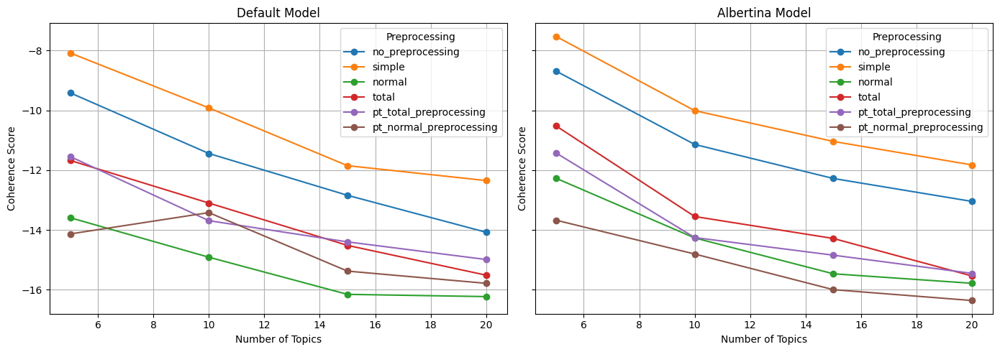

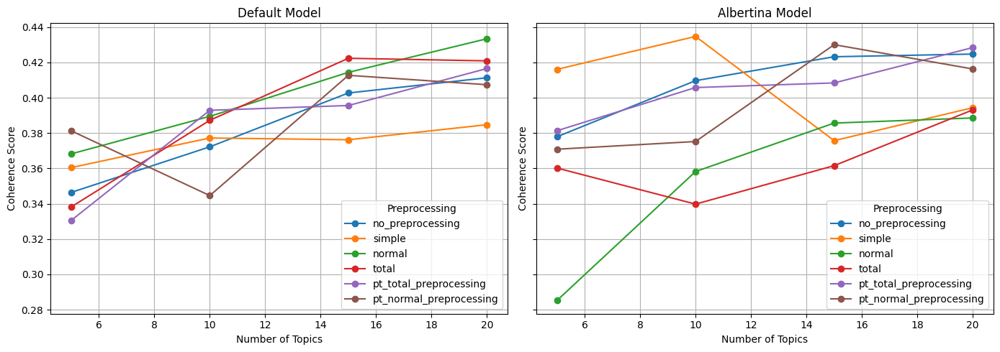

In [ ]:
get_coherence_graphs_by_model(dictionaries_umass)
get_coherence_graphs_by_model(dictionaries_cv)

## Topic Visualization

In [ ]:
!pip install transformers
!pip install sentence_transformers

In [ ]:
def get_embeddings(topics_folder):
    model = SentenceTransformer('marquesafonso/albertina-sts')
    embeddings_dict = {}

    for file_name, topics in topics_folder.items():

        topic_num = 0
        topic_data = {}
        for topic in topics:

          words_data = {}

          for word in topic:
            embedding = model.encode(word)
            words_data[word] = embedding


          topic_id = 'Topic_{}'.format(topic_num)
          topic_data[topic_id] = words_data
          topic_num += 1

        embeddings_dict[file_name] = topic_data


    return embeddings_dict

In [ ]:
embeddings_dict = get_embeddings(topics_folder)

# for context in embeddings_dict:
#   embeddings_dict[context] = [
#       dict(zip(it['word'], it['embedding'])) for it in embeddings_dict[context]
#   ]

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/169 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/772 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/554M [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/963 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/296 [00:00<?, ?B/s]

In [ ]:
from sklearn.manifold import TSNE
import pandas as pd
import matplotlib.pyplot as plt

def get2d_embeddings(model_dict):
  topic_embeddings = {}

  for topic, word_data in model_dict.items():
    words = []
    embeddings = []
    for word, embedding in word_data.items():
      embeddings.append(embedding)
      words.append(word)

    embeddings = np.array(embeddings)

    n_samples = len(embeddings)
    perplexity = min(30, n_samples - 1) if n_samples > 1 else 1

    tsne = TSNE(n_components=2, random_state=42, perplexity=perplexity)
    embeddings_2d = tsne.fit_transform(embeddings)

    topic_embeddings[topic] = (embeddings_2d, words)

  return topic_embeddings





In [ ]:
import matplotlib.cm as cm

In [ ]:
def plot_model_embeddings(all_models_dict):
    for model_name, model_dict in all_models_dict.items():
        topic_embeddings = get2d_embeddings(model_dict)
        plt.figure(figsize=(8, 6))
        plt.title(f"Embeddings for {model_name}")

        colors = cm.get_cmap('tab10', len(topic_embeddings))
        for i, (topic, (points, words)) in enumerate(topic_embeddings.items()):
            xs, ys = points[:, 0], points[:, 1]
            plt.scatter(xs, ys, label=topic, color=colors(i))

        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

In [ ]:
plot_model_embeddings(embeddings_dict)

## TF-IDF + Cosine Similarity

In [ ]:
print(topics_folder['total__default__20_topic_words'])

[['científico', 'ciência', 'cientista', 'comunicação', 'conhecimento', 'comunicar', 'science', 'resultado', 'falta', 'sociedade'], ['político', 'política', 'interesse', 'decisor', 'agenda', 'ideologia', 'público', 'eleitoral', 'vontade', 'falta'], ['comunicação', 'mensagem', 'contacto', 'canal', 'comunicar', 'discurso', 'diálogo', 'forma', 'melhorar', 'criar'], ['solução', 'problema', 'resultado', 'valor', 'foco', 'tema', 'identificar', 'mudança', 'resolução', 'síntese'], ['empatia', 'confiança', 'ouvir', 'falta', 'desconhecimento', 'transparência', 'ignorância', 'realidade', 'visão', 'escutar'], ['stakeholder', 'ator', 'academia', 'brokers', 'mapear', 'criar', 'networking', 'envolvimento', 'técnico', 'rede'], ['público', 'policy', 'briefs', 'consulta', 'participação', 'debate', 'participar', 'nacional', 'europeu', 'evidência'], ['política', 'político', 'ciência', 'investigador', 'científico', 'cientista', 'decisor', 'literacia', 'science', 'policy'], ['económico', 'dinheiro', 'financi

In [ ]:
def topics_to_docs(topics_folder):
  topics_folder_str = {}
  for model, topics in topics_folder.items():
    topics_folder_str[model] = []
    for topic in topics:
      topics_folder_str[model].append(' '.join(topic))
  return topics_folder_str

topics_str = topics_to_docs(topics_folder)

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

In [ ]:
print(topics_str['total__default__5_topic_words'])

['falta interesse prazo problema agenda tempo conhecimento resultado informação solução', 'ciência científico investigação stakeholder evento rede sociedade criar social comunicação', 'político política público decisor ciência interesse económico policy investigador agenda', 'comunicação mensagem canal media contacto comunicar dificuldade estratégia criar forma', 'linguagem acessível diferente técnica pouco claro usar language distinto fácil']


In [ ]:
def similarity_stats(cosine_matrix):
    values = cosine_matrix[np.triu_indices(cosine_matrix.shape[0], k=1)]
    return values.mean(), values.std()


In [ ]:
print(topics_str)

{'no_preprocessing__albertina__5_topic_words': ['de os políticos para com decisores dos não políticas interesses', 'de linguagem diferentes mensagem resultados com prazo dos criar em', 'ciência da de científica política não para do científico em', 'comunicação de falta canais redes financiamento sociais na social formação', 'of and to policy with communication science is clear the'], 'no_preprocessing__albertina__10_topic_words': ['de para criar com investigação diferentes em as dos os', 'de resultados eventos complexidade recursos identificação stakeholders indicadores com media', 'não que são político política políticas políticos as de os', 'decisores políticos os públicas de pública políticas com investigadores dos', 'ciência da política de científica científico entre falta sociedade conhecimento', 'comunicação de canais redes dificuldade na sociais informação social formação', 'of with and to policy science communication policymakers clear is', 'linguagem mensagem acessível técnica

In [ ]:
def get_cosine_similarity_tfidf(topics_str):
  topics_metrics = {}
  cos_sim_dict ={}
  for model, topics in topics_str.items():

    vectorizer = TfidfVectorizer()
    tfidf_matrix = vectorizer.fit_transform(topics)

    cos_sim = cosine_similarity(tfidf_matrix)

    stats = similarity_stats(cos_sim)
    topics_metrics[model] = [stats]
    cos_sim_dict[model] = cos_sim

  return topics_metrics, cos_sim_dict

topics_metrics, cos_sim = get_cosine_similarity_tfidf(topics_str)
print(topics_metrics)
print(cos_sim)

{'no_preprocessing__albertina__5_topic_words': [(np.float64(0.06264678239594788), np.float64(0.07647928958211486))], 'no_preprocessing__albertina__10_topic_words': [(np.float64(0.045881001305491054), np.float64(0.06726695469737712))], 'no_preprocessing__albertina__15_topic_words': [(np.float64(0.036364450895221376), np.float64(0.05766636846077249))], 'no_preprocessing__albertina__20_topic_words': [(np.float64(0.031673052065179036), np.float64(0.062081491797565745))], 'no_preprocessing__default__5_topic_words': [(np.float64(0.060483637466756335), np.float64(0.06059366450766966))], 'no_preprocessing__default__10_topic_words': [(np.float64(0.05977257996187457), np.float64(0.05587466916298152))], 'no_preprocessing__default__15_topic_words': [(np.float64(0.03489346266218923), np.float64(0.054909961150004086))], 'no_preprocessing__default__20_topic_words': [(np.float64(0.02710449821651339), np.float64(0.04901848696055149))], 'simple__albertina__5_topic_words': [(np.float64(0.0832298225761676

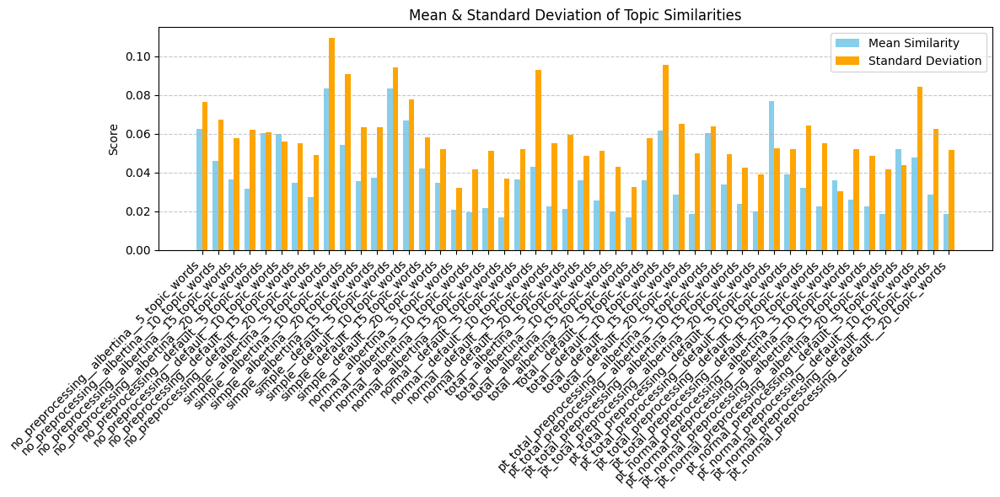

In [ ]:
def plot_metrics(topics_metrics):
  labels = list(topics_metrics.keys())
  means = [val[0][0] for val in topics_metrics.values()]
  stds = [val[0][1] for val in topics_metrics.values()]

  # Bar positions
  x = np.arange(len(labels))
  width = 0.35  # width of each bar

  # Create plot
  fig, ax = plt.subplots(figsize=(12, 6))
  bars1 = ax.bar(x - width/2, means, width, label='Mean Similarity', color='skyblue')
  bars2 = ax.bar(x + width/2, stds, width, label='Standard Deviation', color='orange')

  # Add labels and formatting
  ax.set_ylabel('Score')
  ax.set_title('Mean & Standard Deviation of Topic Similarities')
  ax.set_xticks(x)
  ax.set_xticklabels(labels, rotation=45, ha='right')
  ax.legend()
  ax.grid(axis='y', linestyle='--', alpha=0.7)

  # Show plot
  plt.tight_layout()
  plt.show()

plot_metrics(topics_metrics)

In [ ]:
from collections import defaultdict

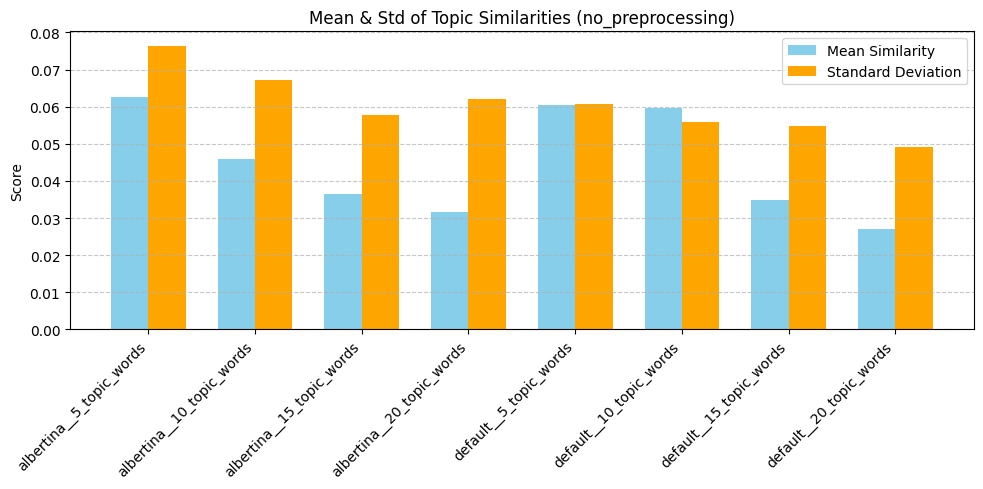

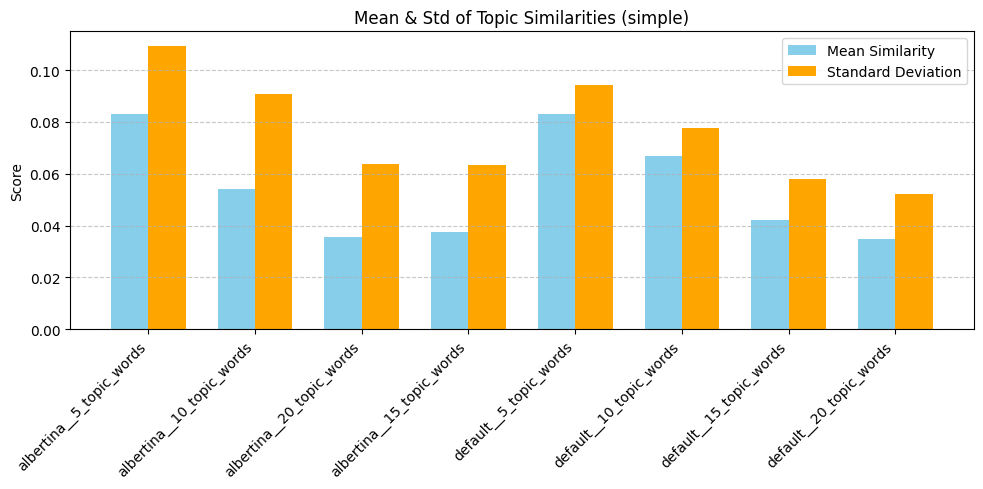

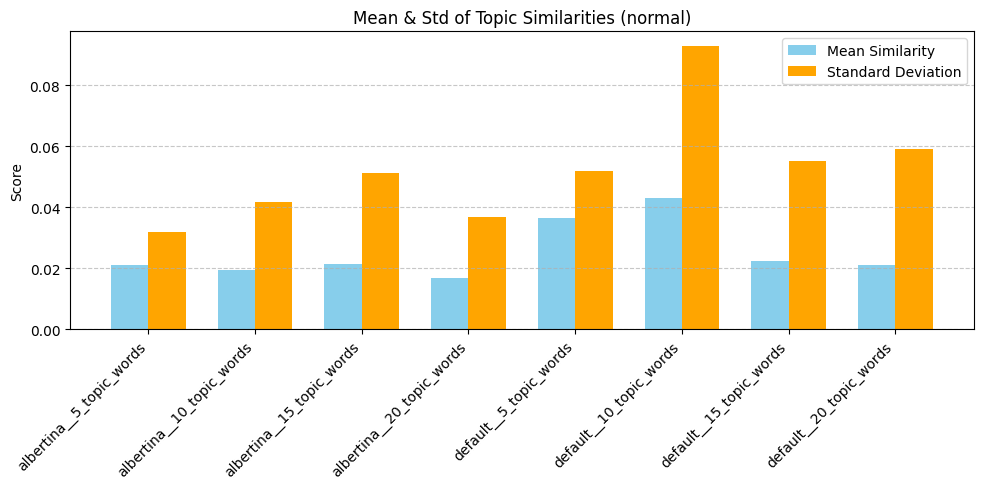

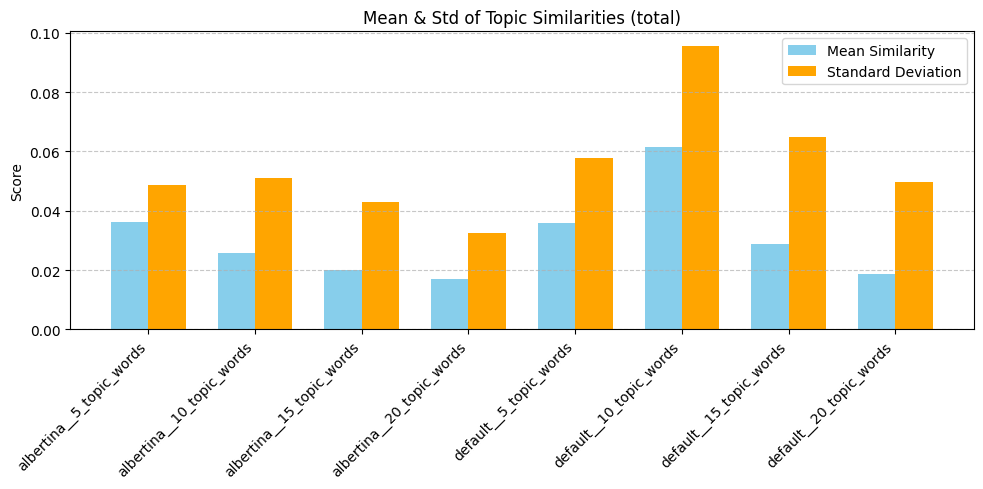

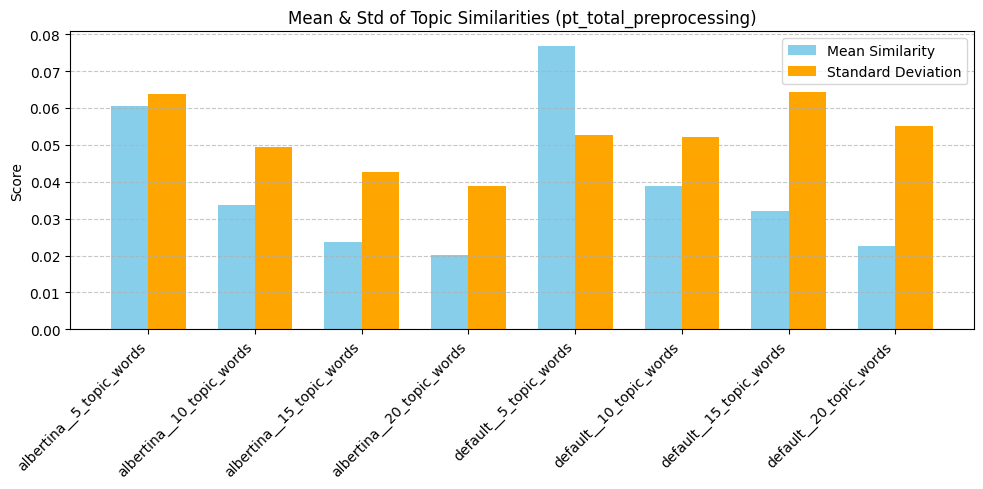

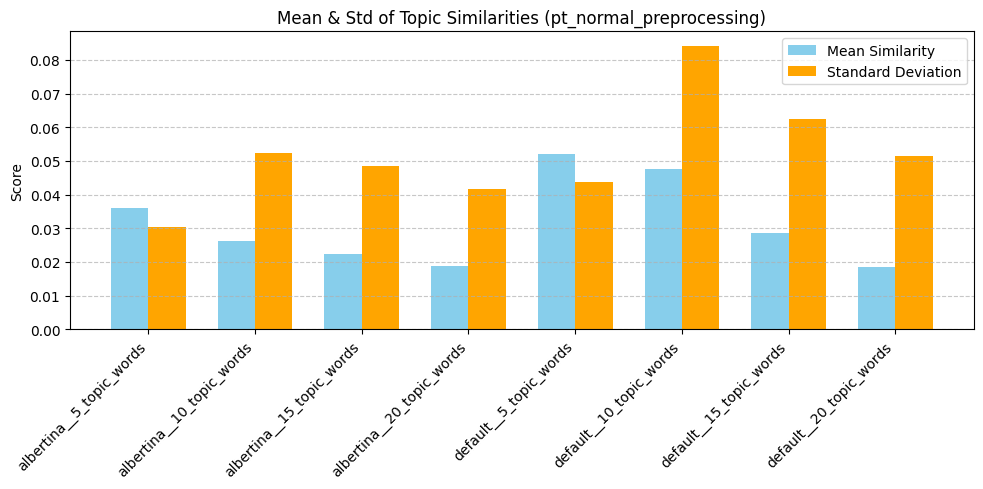

In [ ]:
def plot_metrics_sep(topics_metrics):
  grouped = defaultdict(dict)

  for key, value in topics_metrics.items():
      parts = key.split("__")
      preprocessing = parts[0]
      label = "__".join(parts[1:])  # keep the rest of the label
      grouped[preprocessing][label] = value[0]

  # Step 2: Plot each preprocessing group
  for preprocessing, group_data in grouped.items():
      labels = list(group_data.keys())
      means = [v[0] for v in group_data.values()]
      stds = [v[1] for v in group_data.values()]
      x = np.arange(len(labels))
      width = 0.35

      fig, ax = plt.subplots(figsize=(10, 5))
      ax.bar(x - width/2, means, width, label='Mean Similarity', color='skyblue')
      ax.bar(x + width/2, stds, width, label='Standard Deviation', color='orange')

      ax.set_ylabel('Score')
      ax.set_title(f'Mean & Std of Topic Similarities ({preprocessing})')
      ax.set_xticks(x)
      ax.set_xticklabels(labels, rotation=45, ha='right')
      ax.legend()
      ax.grid(axis='y', linestyle='--', alpha=0.7)

      plt.tight_layout()
      plt.show()

plot_metrics_sep(topics_metrics)

Esta métrica avalia a similaridade intertópicos. Mas nao tem em conta a semelhanca intratopico.

Usa apenas tfidf, ou seja, peca tambem no facto de nao conseguir avaliar palavras semelhantes como proximas (publico / publica). - Fazer lemmatizacao dentro do topico?

## Counters

### Different words in experience

In [ ]:
def flatten_token_lists(nested_lists):
  return [token for sublist in nested_lists for token in sublist]

def flatten_topics_dict(topics_folder):
  flattened_topics = {}
  for key, value in topics_folder.items():
    flattened_topics[key] = flatten_token_lists(value)
  return flattened_topics


flattened_topics_folder = flatten_topics_dict(topics_folder)

In [ ]:
print(flattened_topics_folder)

{'no_preprocessing__albertina__5_topic_words': ['de', 'os', 'políticos', 'para', 'com', 'decisores', 'dos', 'não', 'políticas', 'interesses', 'de', 'linguagem', 'diferentes', 'mensagem', 'resultados', 'com', 'prazo', 'dos', 'criar', 'em', 'ciência', 'da', 'de', 'científica', 'política', 'não', 'para', 'do', 'científico', 'em', 'comunicação', 'de', 'falta', 'canais', 'redes', 'financiamento', 'sociais', 'na', 'social', 'formação', 'of', 'and', 'to', 'policy', 'with', 'communication', 'science', 'is', 'clear', 'the'], 'no_preprocessing__albertina__10_topic_words': ['de', 'para', 'criar', 'com', 'investigação', 'diferentes', 'em', 'as', 'dos', 'os', 'de', 'resultados', 'eventos', 'complexidade', 'recursos', 'identificação', 'stakeholders', 'indicadores', 'com', 'media', 'não', 'que', 'são', 'político', 'política', 'políticas', 'políticos', 'as', 'de', 'os', 'decisores', 'políticos', 'os', 'públicas', 'de', 'pública', 'políticas', 'com', 'investigadores', 'dos', 'ciência', 'da', 'política'

In [ ]:
from collections import Counter

In [ ]:
def word_counter_in_experience(flattened_topics_folder):
  word_count_topics = {}
  for experience, doc in flattened_topics_folder.items():
    total_words = len(doc)
    word_count = dict(Counter(doc))
    word_count_topics[experience] = word_count, total_words
  return word_count_topics

word_count_dict = word_counter_in_experience(flattened_topics_folder)




print(word_count_dict)

{'no_preprocessing__albertina__5_topic_words': ({'de': 4, 'os': 1, 'políticos': 1, 'para': 2, 'com': 2, 'decisores': 1, 'dos': 2, 'não': 2, 'políticas': 1, 'interesses': 1, 'linguagem': 1, 'diferentes': 1, 'mensagem': 1, 'resultados': 1, 'prazo': 1, 'criar': 1, 'em': 2, 'ciência': 1, 'da': 1, 'científica': 1, 'política': 1, 'do': 1, 'científico': 1, 'comunicação': 1, 'falta': 1, 'canais': 1, 'redes': 1, 'financiamento': 1, 'sociais': 1, 'na': 1, 'social': 1, 'formação': 1, 'of': 1, 'and': 1, 'to': 1, 'policy': 1, 'with': 1, 'communication': 1, 'science': 1, 'is': 1, 'clear': 1, 'the': 1}, 50), 'no_preprocessing__albertina__10_topic_words': ({'de': 8, 'para': 1, 'criar': 1, 'com': 3, 'investigação': 1, 'diferentes': 1, 'em': 1, 'as': 2, 'dos': 2, 'os': 3, 'resultados': 1, 'eventos': 1, 'complexidade': 1, 'recursos': 1, 'identificação': 1, 'stakeholders': 1, 'indicadores': 1, 'media': 1, 'não': 1, 'que': 1, 'são': 1, 'político': 1, 'política': 2, 'políticas': 2, 'políticos': 3, 'decisore

In [ ]:
def different_words_in_experience(word_count_dict):
  different_words = {}
  for experience, (word_counts, total_words) in word_count_dict.items():
    different_words[experience] = (len(word_counts), total_words)
  return different_words


different_words = different_words_in_experience(word_count_dict)

ratios_dict = {key: different / total for key, (different, total) in different_words.items()}

print(ratios_dict)

{'no_preprocessing__albertina__5_topic_words': 0.84, 'no_preprocessing__albertina__10_topic_words': 0.79, 'no_preprocessing__albertina__15_topic_words': 0.7666666666666667, 'no_preprocessing__albertina__20_topic_words': 0.75, 'no_preprocessing__default__5_topic_words': 0.84, 'no_preprocessing__default__10_topic_words': 0.73, 'no_preprocessing__default__15_topic_words': 0.7733333333333333, 'no_preprocessing__default__20_topic_words': 0.785, 'simple__albertina__5_topic_words': 0.8, 'simple__albertina__10_topic_words': 0.76, 'simple__albertina__20_topic_words': 0.71, 'simple__albertina__15_topic_words': 0.7466666666666667, 'simple__default__5_topic_words': 0.8, 'simple__default__10_topic_words': 0.71, 'simple__default__15_topic_words': 0.74, 'simple__default__20_topic_words': 0.735, 'normal__albertina__5_topic_words': 0.86, 'normal__albertina__10_topic_words': 0.85, 'normal__albertina__15_topic_words': 0.8066666666666666, 'normal__albertina__20_topic_words': 0.815, 'normal__default__5_top

### Same stem in topic

In [ ]:
!pip install nltk

In [ ]:
import nltk
nltk.download('rslp')
from nltk import stem

[nltk_data] Downloading package rslp to /root/nltk_data...
[nltk_data]   Unzipping stemmers/rslp.zip.


In [ ]:
print(topics_folder)

{'no_preprocessing__albertina__5_topic_words': [['de', 'os', 'políticos', 'para', 'com', 'decisores', 'dos', 'não', 'políticas', 'interesses'], ['de', 'linguagem', 'diferentes', 'mensagem', 'resultados', 'com', 'prazo', 'dos', 'criar', 'em'], ['ciência', 'da', 'de', 'científica', 'política', 'não', 'para', 'do', 'científico', 'em'], ['comunicação', 'de', 'falta', 'canais', 'redes', 'financiamento', 'sociais', 'na', 'social', 'formação'], ['of', 'and', 'to', 'policy', 'with', 'communication', 'science', 'is', 'clear', 'the']], 'no_preprocessing__albertina__10_topic_words': [['de', 'para', 'criar', 'com', 'investigação', 'diferentes', 'em', 'as', 'dos', 'os'], ['de', 'resultados', 'eventos', 'complexidade', 'recursos', 'identificação', 'stakeholders', 'indicadores', 'com', 'media'], ['não', 'que', 'são', 'político', 'política', 'políticas', 'políticos', 'as', 'de', 'os'], ['decisores', 'políticos', 'os', 'públicas', 'de', 'pública', 'políticas', 'com', 'investigadores', 'dos'], ['ciência

In [ ]:
stemmer = nltk.stem.RSLPStemmer()


def stem_topic_words(topics_folder):
  stemmed_topics_dict = {}
  for experience, topics in topics_folder.items():
    all_topics_stemmed = []
    for topic in topics:
      topic_stemmed = [stemmer.stem("de" if word in ("dos", "das", "do", "da") else word) for word in topic if word != ""]
      all_topics_stemmed.append(topic_stemmed)
    stemmed_topics_dict[experience] = all_topics_stemmed
  return stemmed_topics_dict


stemmed_topics_dict= stem_topic_words(topics_folder)

In [ ]:
print(stemmed_topics_dict)

{'no_preprocessing__albertina__5_topic_words': [['de', 'os', 'polít', 'par', 'com', 'deci', 'de', 'não', 'polít', 'inter'], ['de', 'lingu', 'difer', 'mens', 'result', 'com', 'praz', 'de', 'cri', 'em'], ['ciênc', 'de', 'de', 'científ', 'polít', 'não', 'par', 'de', 'científ', 'em'], ['comunic', 'de', 'falt', 'canal', 'red', 'financ', 'soc', 'na', 'soc', 'form'], ['of', 'and', 'to', 'policy', 'with', 'communication', 'scienc', 'is', 'cle', 'the']], 'no_preprocessing__albertina__10_topic_words': [['de', 'par', 'cri', 'com', 'investig', 'difer', 'em', 'as', 'de', 'os'], ['de', 'result', 'event', 'complex', 'recurs', 'identific', 'stakehold', 'indic', 'com', 'med'], ['não', 'que', 'são', 'polít', 'polít', 'polít', 'polít', 'as', 'de', 'os'], ['deci', 'polít', 'os', 'públic', 'de', 'públic', 'polít', 'com', 'investig', 'de'], ['ciênc', 'de', 'polít', 'de', 'científ', 'científ', 'entr', 'falt', 'sociedad', 'conhec'], ['comunic', 'de', 'canal', 'red', 'dificuldad', 'na', 'soc', 'inform', 'soc',

In [ ]:
def get_repeated_words(stemmed_topics_dict):
  ## returns a dict within a dict which is the type {exp:{topic number: (x0,y0), topic number: (x1,y1), ...}, {exp...} where each (x,y) pair
  ## represents the (number of words that appear more than once, number of appearences of those words)
  count_repeted_dict = {}
  for experience, topics in stemmed_topics_dict.items():
    count_topic_dict = {}
    for i, topic in enumerate(topics):
        count = Counter(topic)
        repeted = {word: num for word, num in count.items() if num > 1}
        if len(repeted) > 0:
          num_words_repeted = len(repeted)
          repetition = sum(repeted.values())
          count_topic_dict[i] = (num_words_repeted, repetition), list(repeted.keys())
    count_repeted_dict[experience] = count_topic_dict
  return count_repeted_dict


repeated_words_dict = get_repeated_words(stemmed_topics_dict)

In [ ]:
print(repeated_words_dict)

{'no_preprocessing__albertina__5_topic_words': {0: ((2, 4), ['de', 'polít']), 1: ((1, 2), ['de']), 2: ((2, 5), ['de', 'científ']), 3: ((1, 2), ['soc'])}, 'no_preprocessing__albertina__10_topic_words': {0: ((1, 2), ['de']), 2: ((1, 4), ['polít']), 3: ((3, 6), ['polít', 'públic', 'de']), 4: ((2, 4), ['de', 'científ']), 5: ((1, 2), ['soc']), 7: ((2, 4), ['lingu', 'mens']), 8: ((2, 4), ['inter', 'económ'])}, 'no_preprocessing__albertina__15_topic_words': {2: ((1, 2), ['soc']), 3: ((1, 3), ['de']), 4: ((1, 4), ['polít']), 5: ((2, 5), ['de', 'científ']), 6: ((1, 2), ['de']), 9: ((2, 5), ['inter', 'económ']), 10: ((1, 2), ['lingu']), 12: ((4, 8), ['públic', 'polít', 'particip', 'na'])}, 'no_preprocessing__albertina__20_topic_words': {2: ((1, 2), ['de']), 4: ((1, 3), ['polít']), 5: ((2, 4), ['científ', 'de']), 6: ((1, 2), ['de']), 7: ((1, 2), ['soc']), 8: ((1, 2), ['de']), 9: ((3, 6), ['públic', 'polít', 'de']), 13: ((1, 2), ['estratég']), 15: ((1, 2), ['mens']), 17: ((2, 5), ['inter', 'económ

In [ ]:
import unicodedata
def strip_accents(text):
  return ''.join(
      c for c in unicodedata.normalize('NFD', text)
      if unicodedata.category(c) != 'Mn'
  )

In [ ]:
stemmer = nltk.stem.RSLPStemmer()

def get_words_from_stems(repeated_words_dict, topics_folder):
    words_dict = {}
    for experience, topics in repeated_words_dict.items():
        words_per_topic = {}
        for index, topic in topics.items():
            words_from_stem = []
            for word in topics_folder[experience][index]:
                word_stemmed = stemmer.stem(word)
                word_normalized = strip_accents(word_stemmed.lower())

                for stem in topic[1]:
                    stem_normalized = strip_accents(stem.lower())
                    if word_normalized == stem_normalized:
                        words_from_stem.append(word)
            words_per_topic[index] = words_from_stem

        words_dict[experience] = words_per_topic
    return words_dict

words_from_stem_dicet = get_words_from_stems(repeated_words_dict, topics_folder)

In [ ]:
import re
def check_significant_words_uniqueness(repeated_words_dict):
    results = {}

    for exp, topics in repeated_words_dict.items():
        # Extract number of topics from the experiment name
        # Example format: "no_preprocessing__albertina__6_topic_words"
        match = re.search(r'__(\d+)_topic_words', exp)
        if not match:
            max_topic = max(topics.keys()) if topics else -1
            total_topics = max_topic
        else:
            total_topics = int(match.group(1))

        # Map word -> topics where it appears
        word_to_topics = {}

        # First, gather all significant words by topic for present topics
        for topic_num, value in topics.items():
            words = value[1]
            for w in words:
                if w not in word_to_topics:
                    word_to_topics[w] = set()
                word_to_topics[w].add(topic_num)

        # Now, check all topics (including missing ones)
        topic_info = {}
        for topic_num in range(total_topics):
            if topic_num in topics:
                words = topics[topic_num][1]
                if not words:
                    topic_info[topic_num] = {
                        "has_significant_word": False,
                        "unique_words": set(),
                        "non_unique_words": set()
                    }
                else:
                    unique_words = {w for w in words if len(word_to_topics[w]) == 1}
                    non_unique_words = set(words) - unique_words
                    topic_info[topic_num] = {
                        "has_significant_word": True,
                        "unique_words": unique_words,
                        "non_unique_words": non_unique_words
                    }
            else:
                # Topic missing => no significant words
                topic_info[topic_num] = {
                    "has_significant_word": False,
                    "unique_words": set(),
                    "non_unique_words": set()
                }

        results[exp] = topic_info

    return results


In [ ]:
significant_unique_dict = check_significant_words_uniqueness(repeated_words_dict)
print(significant_unique_dict)

{'no_preprocessing__albertina__5_topic_words': {0: {'has_significant_word': True, 'unique_words': {'polít'}, 'non_unique_words': {'de'}}, 1: {'has_significant_word': True, 'unique_words': set(), 'non_unique_words': {'de'}}, 2: {'has_significant_word': True, 'unique_words': {'científ'}, 'non_unique_words': {'de'}}, 3: {'has_significant_word': True, 'unique_words': {'soc'}, 'non_unique_words': set()}, 4: {'has_significant_word': False, 'unique_words': set(), 'non_unique_words': set()}}, 'no_preprocessing__albertina__10_topic_words': {0: {'has_significant_word': True, 'unique_words': set(), 'non_unique_words': {'de'}}, 1: {'has_significant_word': False, 'unique_words': set(), 'non_unique_words': set()}, 2: {'has_significant_word': True, 'unique_words': set(), 'non_unique_words': {'polít'}}, 3: {'has_significant_word': True, 'unique_words': {'públic'}, 'non_unique_words': {'de', 'polít'}}, 4: {'has_significant_word': True, 'unique_words': {'científ'}, 'non_unique_words': {'de'}}, 5: {'has_

In [ ]:
significant_unique_dict_df = pd.DataFrame(significant_unique_dict["no_preprocessing__albertina__5_topic_words"])
for exp in significant_unique_dict.keys():

  df = pd.DataFrame(significant_unique_dict[exp])
  print(exp)
  print(df)
  print("###################################################################################")

no_preprocessing__albertina__5_topic_words
                            0     1          2      3      4
has_significant_word     True  True       True   True  False
unique_words          {polít}    {}  {científ}  {soc}     {}
non_unique_words         {de}  {de}       {de}     {}     {}
###################################################################################
no_preprocessing__albertina__10_topic_words
                         0      1        2            3          4      5  \
has_significant_word  True  False     True         True       True   True   
unique_words            {}     {}       {}     {públic}  {científ}  {soc}   
non_unique_words      {de}     {}  {polít}  {de, polít}       {de}     {}   

                          6              7                8      9  
has_significant_word  False           True             True  False  
unique_words             {}  {mens, lingu}  {inter, económ}     {}  
non_unique_words         {}             {}               {}     {}  


### Similarity within topic - Cosine-similarity between embeddings

In [ ]:
import spacy
!python -m spacy download pt_core_news_lg

nlp_spacy = spacy.load("pt_core_news_lg")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 568.2/568.2 MB 1.5 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('pt_core_news_lg')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [ ]:
from itertools import combinations

In [ ]:
from numpy import dot
from numpy.linalg import norm

In [ ]:
def get_cos_sim(embeddings_dict):
    topic_similarity_dict = {}

    for experience, topics in embeddings_dict.items():
        all_cos_sims = {}

        for topic, words in topics.items():
            cos_sim_per_topic = []
            word_vectors = list(words.values())
            for embedding1, embedding2 in combinations(word_vectors, 2):
                cosine_similarity = dot(embedding1, embedding2) / (norm(embedding1) * norm(embedding2))
                cos_sim_per_topic.append(cosine_similarity)
            all_cos_sims[topic] = {
                "topic mean": np.mean(cos_sim_per_topic),
                "cs min words": np.min(cos_sim_per_topic),
                "cs max words": np.max(cos_sim_per_topic),
                "closest words": [sim for sim in cos_sim_per_topic if sim > 0.85]
            }

        topic_sim_list = {k: v['topic mean'] for k, v in all_cos_sims.items() if 'topic mean' in v}
        topic_sim_list = list(topic_sim_list.values())

        topic_similarity_dict[experience] = {
            'min': np.min(topic_sim_list),
            'max': np.max(topic_sim_list),
            'per topic': all_cos_sims
        }


    return topic_similarity_dict


topic_similarity_dict=get_cos_sim(embeddings_dict)
print(topic_similarity_dict)

{'no_preprocessing__albertina__5_topic_words': {'min': np.float32(0.40445116), 'max': np.float32(0.7704916), 'per topic': {'Topic_0': {'topic mean': np.float32(0.437365), 'cs min words': np.float32(0.20015039), 'cs max words': np.float32(0.8680282), 'closest words': [np.float32(0.8680282)]}, 'Topic_1': {'topic mean': np.float32(0.44773796), 'cs min words': np.float32(0.1980149), 'cs max words': np.float32(0.87476325), 'closest words': [np.float32(0.87476325)]}, 'Topic_2': {'topic mean': np.float32(0.44862106), 'cs min words': np.float32(0.2775617), 'cs max words': np.float32(0.9997918), 'closest words': [np.float32(0.9997918), np.float32(0.9011412)]}, 'Topic_3': {'topic mean': np.float32(0.40445116), 'cs min words': np.float32(0.17955537), 'cs max words': np.float32(0.81839705), 'closest words': []}, 'Topic_4': {'topic mean': np.float32(0.7704916), 'cs min words': np.float32(0.36145678), 'cs max words': np.float32(0.98871994), 'closest words': [np.float32(0.8637027), np.float32(0.89719

média dos cosine similarities entre os embeddings de cada tópico

min - média dos cosine similarities entre os embeddings mais baixa nessa experiencia

max - média dos cosine similarities entre os embeddings mais alta nessa experiencia

**per topic**

* min - cosine similarity entre 2 embeddings mais baixo

* max - cosine similarity entre 2 embeddings mais alto

* topic mean - média dos cosine similarities entre os embeddings nesse tópico

In [ ]:

import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats


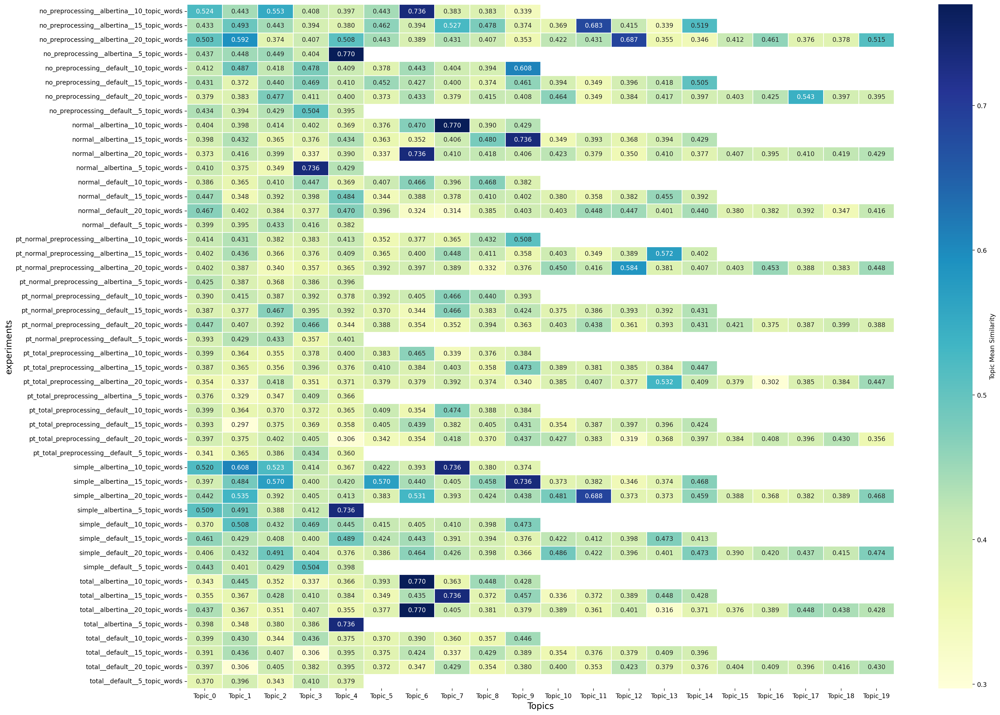

In [ ]:
topic_means_data = {}

for exp_name, exp_data in topic_similarity_dict.items():
    topic_means = {}
    for topic, metrics in exp_data["per topic"].items():
        topic_means[topic] = metrics["topic mean"]
    topic_means_data[exp_name] = topic_means

df_heatmap = pd.DataFrame.from_dict(topic_means_data, orient="index")
df_heatmap = df_heatmap.sort_index()  # ordena por nome da experiência (opcional)
df_heatmap = df_heatmap.round(3)

# Criação do heatmap
plt.figure(figsize=(24, 16), dpi=200)  # Aumenta a resolução com dpi=200 (ou 300)
sns.heatmap(
    df_heatmap,
    annot=True,
    cmap="YlGnBu",
    linewidths=0.5,
    fmt=".3f",
    cbar=True,  # ativa a legenda
    cbar_kws={"label": "Topic Mean Similarity"}  # nome da legenda
)
plt.xlabel("Topics", fontsize=14)
plt.ylabel("experiments", fontsize=14)
plt.tight_layout()
plt.show()

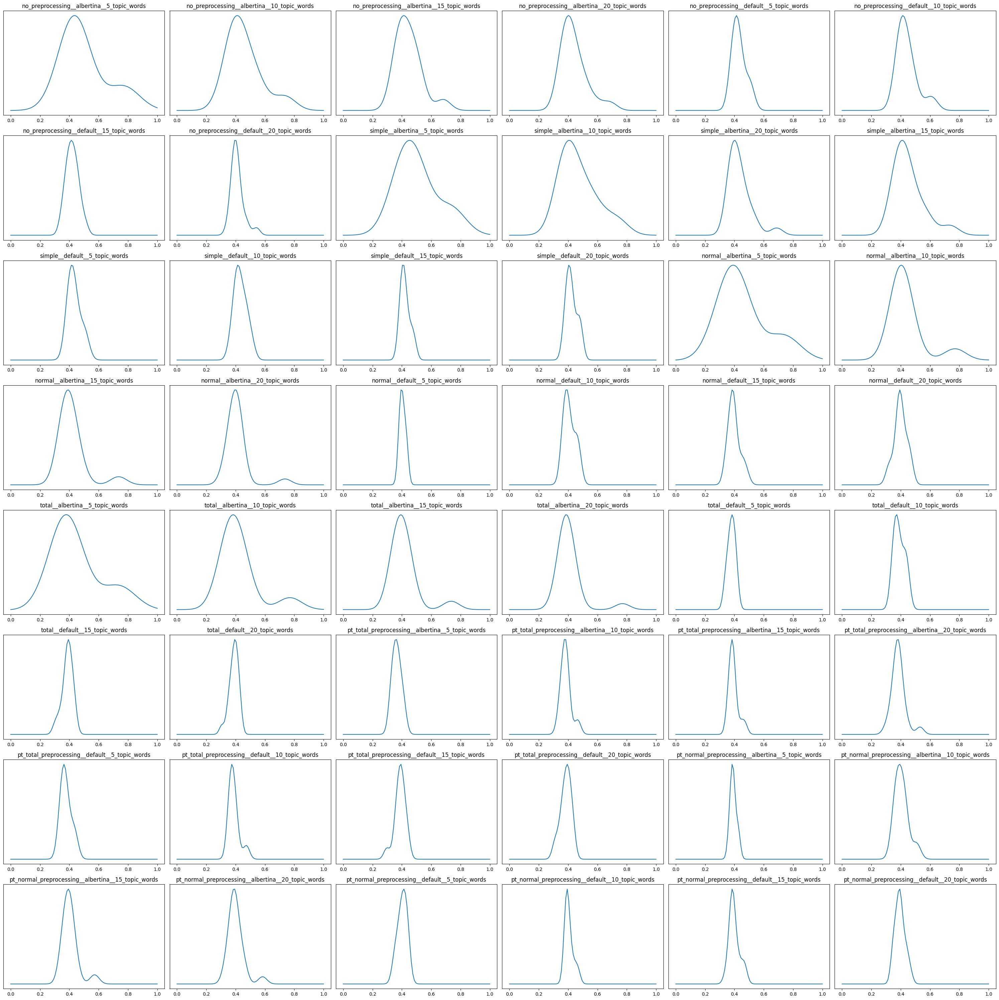

In [ ]:
fig, axs = plt.subplots(figsize=(30,30), nrows=8, ncols=6)
axs_flat=axs.flat

for i, (exp_name, exp_data) in enumerate(topic_means_data.items()):
    topic_means = list(exp_data.values())
    kde = stats.gaussian_kde(topic_means)
    x = np.linspace(0, 1, 100)
    axs_flat[i].plot(x, kde(x))
    axs_flat[i].set_title(exp_name)
    axs_flat[i].set_yticks([])

plt.tight_layout()
plt.show()

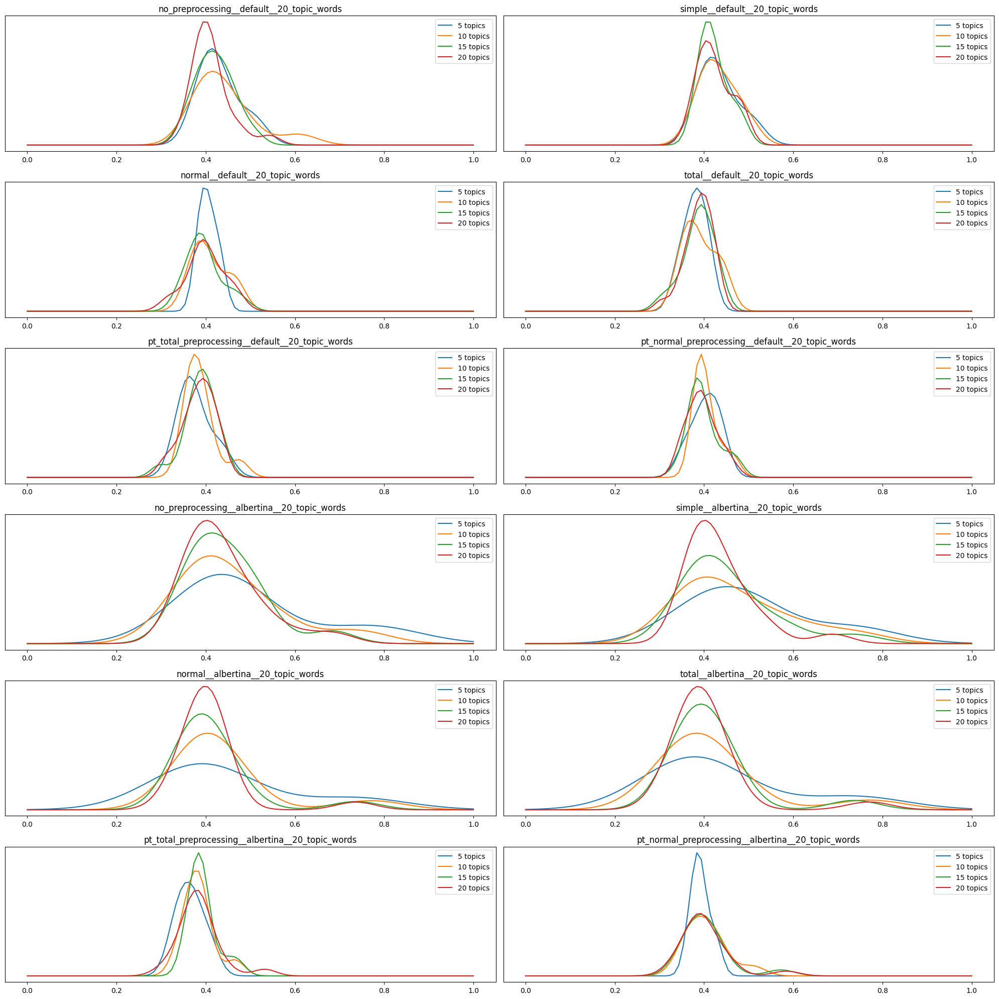

In [ ]:
processing_names = ["no_preprocessing", "simple", "normal", "total", "pt_total_preprocessing", "pt_normal_preprocessing"]
model_names = ["default", "albertina"]
num_topics = [5, 10, 15, 20]

fig, axs = plt.subplots(figsize=(20,20), nrows=6, ncols=2)
axs_flat=axs.flat

i=0
for model in model_names:
  for pre in processing_names:
    ax = axs_flat[i]
    for num in num_topics:
      exp_name = f"{pre}__{model}__{num}_topic_words"
      exp_data = list(topic_means_data[exp_name].values())
      kde = stats.gaussian_kde(exp_data)
      x = np.linspace(0, 1, 100)
      ax.plot(x, kde(x), label=f"{num} topics")
      ax.legend()
      ax.set_title(exp_name)
      ax.set_yticks([])
    i+=1

plt.tight_layout()
plt.show()

In [ ]:
pd.DataFrame.from_dict(topic_similarity_dict, orient='index')

,min,max,per topic
no_preprocessing__albertina__5_topic_words,0.404451,0.770492,"{'Topic_0': {'topic mean': 0.437365, 'cs min w..."
no_preprocessing__albertina__10_topic_words,0.339128,0.736411,"{'Topic_0': {'topic mean': 0.52400184, 'cs min..."
no_preprocessing__albertina__15_topic_words,0.339128,0.682506,"{'Topic_0': {'topic mean': 0.43338493, 'cs min..."
no_preprocessing__albertina__20_topic_words,0.345655,0.686933,"{'Topic_0': {'topic mean': 0.5034132, 'cs min ..."
no_preprocessing__default__5_topic_words,0.394431,0.503973,"{'Topic_0': {'topic mean': 0.4336364, 'cs min ..."
no_preprocessing__default__10_topic_words,0.378087,0.607964,"{'Topic_0': {'topic mean': 0.4119684, 'cs min ..."
no_preprocessing__default__15_topic_words,0.348620,0.505101,"{'Topic_0': {'topic mean': 0.43092656, 'cs min..."
no_preprocessing__default__20_topic_words,0.348620,0.543041,"{'Topic_0': {'topic mean': 0.37944204, 'cs min..."
simple__albertina__5_topic_words,0.388143,0.736411,"{'Topic_0': {'topic mean': 0.5090805, 'cs min ..."
simple__albertina__10_topic_words,0.367028,0.736411,"{'Topic_0': {'topic mean': 0.5199901, 'cs min ..."


### Similarity between Topics (in same experience) - Cosine Similarity

1o - calcular um vetor para cada tópico (fazendo a média dos embeddings de todas as palavras do tópico)

2o - calcular a similaridade do coseno entre todos os topicos.

3o - extrair min, max e média

In [ ]:
def get_vectors_from_embeddings(embeddings_dict):
  vectors_dict = {}
  for experience, topics in embeddings_dict.items():
    vectors = {}
    for topic, words in topics.items():
      embeddings = np.array(list(words.values()))
      mean_vector = np.mean(embeddings, axis=0)
      vectors[topic] = mean_vector
    vectors_dict[experience] = vectors
  return vectors_dict

def cos_sim_between_topics(vectors_dict):
  cos_sim_dict = {}
  for experience, topics in vectors_dict.items():
    vectors = list(topics.values())
    cos_sim_list = []

    for embedding1, embedding2 in combinations(vectors, 2):
      cosine_similarity = dot(embedding1, embedding2)/(norm(embedding1)*norm(embedding2))
      cos_sim_list.append(cosine_similarity)

    cos_sim_dict[experience] = {
            'min': np.min(cos_sim_list),
            'max': np.max(cos_sim_list),
            'mean': np.mean(cos_sim_list)
        }
  return cos_sim_dict

vectors_dict = get_vectors_from_embeddings(embeddings_dict)
cos_sim_between_topics = cos_sim_between_topics(vectors_dict)
print(cos_sim_between_topics)

{'no_preprocessing__albertina__5_topic_words': {'min': np.float32(0.8400412), 'max': np.float32(0.93247443), 'mean': np.float32(0.87757045)}, 'no_preprocessing__albertina__10_topic_words': {'min': np.float32(0.72602826), 'max': np.float32(0.93072075), 'mean': np.float32(0.83432233)}, 'no_preprocessing__albertina__15_topic_words': {'min': np.float32(0.7202499), 'max': np.float32(0.93770516), 'mean': np.float32(0.8344931)}, 'no_preprocessing__albertina__20_topic_words': {'min': np.float32(0.6688474), 'max': np.float32(0.9186961), 'mean': np.float32(0.8125514)}, 'no_preprocessing__default__5_topic_words': {'min': np.float32(0.83086693), 'max': np.float32(0.92215043), 'mean': np.float32(0.86888105)}, 'no_preprocessing__default__10_topic_words': {'min': np.float32(0.75887716), 'max': np.float32(0.9313411), 'mean': np.float32(0.85532886)}, 'no_preprocessing__default__15_topic_words': {'min': np.float32(0.7494614), 'max': np.float32(0.932767), 'mean': np.float32(0.83300585)}, 'no_preprocessin

In [ ]:
df_cos_sim_between_topics = pd.DataFrame.from_dict(cos_sim_between_topics, orient='index')
df_cos_sim_between_topics

,min,max,mean
no_preprocessing__albertina__5_topic_words,0.840041,0.932474,0.877570
no_preprocessing__albertina__10_topic_words,0.726028,0.930721,0.834322
no_preprocessing__albertina__15_topic_words,0.720250,0.937705,0.834493
no_preprocessing__albertina__20_topic_words,0.668847,0.918696,0.812551
no_preprocessing__default__5_topic_words,0.830867,0.922150,0.868881
no_preprocessing__default__10_topic_words,0.758877,0.931341,0.855329
no_preprocessing__default__15_topic_words,0.749461,0.932767,0.833006
no_preprocessing__default__20_topic_words,0.721595,0.913552,0.824415
simple__albertina__5_topic_words,0.818614,0.928296,0.881191
simple__albertina__10_topic_words,0.744774,0.961942,0.838620


Using Saliency-weighted semantic network

In [ ]:
def f_sem(word, w_prime):
    return dot(word, w_prime)/(norm(word)*norm(w_prime))

def sem(w, sent, f_sem_func):
    return max(f_sem_func(w, w_prime) for w_prime in sent)

def f_sts(topic1, topic2, k1=1.5, b=0.75, avgsl=1.0, f_sem_func=None):

    score = 0.0
    len_topic2 = len(topic2)

    for w in topic1:
        sem_w_ss = sem(w, topic2, f_sem_func)
        numerator = sem_w_ss * (k1 + 1)
        denominator = sem_w_ss + k1 * (1 - b + b * len_topic2 / avgsl)
        score += (numerator / denominator)

    return score

In [ ]:
def run_sws(embeddings_dict):
  results = {}
  for experience, topics in embeddings_dict.items():
     for topic1, topic2 in combinations(topics.keys(), 2):
        avgsl = sum(len(v) for v in embeddings_dict) / len(embeddings_dict)
        score= f_sts(topic1, topic2, avgsl = avgsl, f_sem_func=f_sem)

        results[(topic1, topic2)] = score

  return results

### Table with all Results

In [ ]:
has_significant_word_dict = {}
unique_words_dict = {}
non_unique_words_dict = {}
for experience, topics in significant_unique_dict.items():
    has_significant_word_dict[experience] = {k: v['has_significant_word'] for k, v in topics.items()}
    unique_words_dict[experience] = {k: v['unique_words'] for k, v in topics.items()}
    non_unique_words_dict[experience] = {k: v['non_unique_words'] for k, v in topics.items()}

print(has_significant_word_dict)
print(unique_words_dict)
print(non_unique_words_dict)

cosine_sim_dict = {k: v['mean'] for k, v in topic_similarity_dict.items() if 'mean' in v}


{'no_preprocessing__albertina__5_topic_words': {0: True, 1: True, 2: True, 3: True, 4: False}, 'no_preprocessing__albertina__10_topic_words': {0: True, 1: False, 2: True, 3: True, 4: True, 5: True, 6: False, 7: True, 8: True, 9: False}, 'no_preprocessing__albertina__15_topic_words': {0: False, 1: False, 2: True, 3: True, 4: True, 5: True, 6: True, 7: False, 8: False, 9: True, 10: True, 11: False, 12: True, 13: False, 14: False}, 'no_preprocessing__albertina__20_topic_words': {0: False, 1: False, 2: True, 3: False, 4: True, 5: True, 6: True, 7: True, 8: True, 9: True, 10: False, 11: False, 12: False, 13: True, 14: False, 15: True, 16: False, 17: True, 18: True, 19: False}, 'no_preprocessing__default__5_topic_words': {0: True, 1: True, 2: True, 3: True, 4: True}, 'no_preprocessing__default__10_topic_words': {0: True, 1: True, 2: True, 3: True, 4: True, 5: True, 6: True, 7: True, 8: False, 9: False}, 'no_preprocessing__default__15_topic_words': {0: True, 1: True, 2: True, 3: True, 4: True

In [ ]:
print(cosine_sim_dict)

{}


In [ ]:
data = [ratios_dict, cosine_sim_dict, has_significant_word_dict,unique_words_dict,non_unique_words_dict, words_from_stem_dicet]

df_all_info = pd.DataFrame(data).T
new_column_names = {
    0: "Different Words in Exp",
    1: "Cosine Similarity mean",
    2: "Unique significant stems in exp",
    3: "Non Unique significant stems in exp",
    4: "Words from stems in exp",
    5: "Topics have significant Stem?"
}

df_all_info = df_all_info.rename(columns=new_column_names)



In [ ]:
df_all_info

,Different Words in Exp,Cosine Similarity mean,Unique significant stems in exp,Non Unique significant stems in exp,Words from stems in exp,Topics have significant Stem?
no_preprocessing__albertina__5_topic_words,0.84,NaN,"{0: True, 1: True, 2: True, 3: True, 4: False}","{0: {'polít'}, 1: {}, 2: {'científ'}, 3: {'soc...","{0: {'de'}, 1: {'de'}, 2: {'de'}, 3: {}, 4: {}}","{0: ['de', 'políticos', 'políticas'], 1: ['de'..."
no_preprocessing__albertina__10_topic_words,0.79,NaN,"{0: True, 1: False, 2: True, 3: True, 4: True,...","{0: {}, 1: {}, 2: {}, 3: {'públic'}, 4: {'cien...","{0: {'de'}, 1: {}, 2: {'polít'}, 3: {'de', 'po...","{0: ['de'], 2: ['político', 'política', 'polít..."
no_preprocessing__albertina__15_topic_words,0.766667,NaN,"{0: False, 1: False, 2: True, 3: True, 4: True...","{0: {}, 1: {}, 2: {'soc'}, 3: {}, 4: {}, 5: {'...","{0: {}, 1: {}, 2: {}, 3: {'de'}, 4: {'polít'},...","{2: ['sociais', 'social'], 3: ['de'], 4: ['pol..."
no_preprocessing__albertina__20_topic_words,0.75,NaN,"{0: False, 1: False, 2: True, 3: False, 4: Tru...","{0: {}, 1: {}, 2: {}, 3: {}, 4: {}, 5: {'cient...","{0: {}, 1: {}, 2: {'de'}, 3: {}, 4: {'polít'},...","{2: ['de'], 4: ['políticas', 'político', 'polí..."
no_preprocessing__default__5_topic_words,0.84,NaN,"{0: True, 1: True, 2: True, 3: True, 4: True}","{0: {'polít'}, 1: {}, 2: {'investig'}, 3: {'co...","{0: {'de'}, 1: {'de'}, 2: {'de'}, 3: {}, 4: {}}","{0: ['de', 'políticos', 'políticas'], 1: ['de'..."
no_preprocessing__default__10_topic_words,0.73,NaN,"{0: True, 1: True, 2: True, 3: True, 4: True, ...","{0: {}, 1: {}, 2: {'científ'}, 3: {'problem'},...","{0: {'de'}, 1: {'polít'}, 2: {'de'}, 3: {}, 4:...","{0: ['de'], 1: ['políticos', 'políticas'], 2: ..."
no_preprocessing__default__15_topic_words,0.773333,NaN,"{0: True, 1: True, 2: True, 3: True, 4: True, ...","{0: {}, 1: {'comunic'}, 2: {'complex'}, 3: {'c...","{0: {'de', 'polít'}, 1: {}, 2: {}, 3: {'de'}, ...","{0: ['políticos', 'de', 'políticas'], 1: ['com..."
no_preprocessing__default__20_topic_words,0.785,NaN,"{0: True, 1: True, 2: True, 3: False, 4: True,...","{0: {}, 1: {}, 2: {'científ'}, 3: {}, 4: {'age...","{0: {'de'}, 1: {'comunic'}, 2: {'de'}, 3: {}, ...","{0: ['de'], 1: ['comunicação', 'comunicar'], 2..."
simple__albertina__5_topic_words,0.8,NaN,"{0: True, 1: True, 2: True, 3: True, 4: False}","{0: {}, 1: {'polít'}, 2: {'científ'}, 3: {'soc...","{0: {'de'}, 1: {'de'}, 2: {'de'}, 3: {}, 4: {}}","{0: ['de'], 1: ['de', 'políticos', 'políticas'..."
simple__albertina__10_topic_words,0.76,NaN,"{0: True, 1: False, 2: True, 3: True, 4: True,...","{0: {'polít'}, 1: {}, 2: {}, 3: {'científ'}, 4...","{0: {}, 1: {}, 2: {'de'}, 3: {'de'}, 4: {'de'}...","{0: ['políticos', 'políticas', 'política'], 2:..."


## Singularity Score

In [ ]:
print(significant_unique_dict)

{'no_preprocessing__albertina__5_topic_words': {0: {'has_significant_word': True, 'unique_words': {'polít'}, 'non_unique_words': {'de'}}, 1: {'has_significant_word': True, 'unique_words': set(), 'non_unique_words': {'de'}}, 2: {'has_significant_word': True, 'unique_words': {'científ'}, 'non_unique_words': {'de'}}, 3: {'has_significant_word': True, 'unique_words': {'soc'}, 'non_unique_words': set()}, 4: {'has_significant_word': False, 'unique_words': set(), 'non_unique_words': set()}}, 'no_preprocessing__albertina__10_topic_words': {0: {'has_significant_word': True, 'unique_words': set(), 'non_unique_words': {'de'}}, 1: {'has_significant_word': False, 'unique_words': set(), 'non_unique_words': set()}, 2: {'has_significant_word': True, 'unique_words': set(), 'non_unique_words': {'polít'}}, 3: {'has_significant_word': True, 'unique_words': {'públic'}, 'non_unique_words': {'de', 'polít'}}, 4: {'has_significant_word': True, 'unique_words': {'científ'}, 'non_unique_words': {'de'}}, 5: {'has_

### -- Significant Word, Uinque SW, Non-Unique SW

In [ ]:
w_SW = 0.2
w_USW = 0.4
w_NUSW = 0.4
results = {}
for exp, values in significant_unique_dict.items():
  print("#####################\n", exp)
  score = {}
  for i, counters in values.items():
    print(i, "-----------------------------------------")
    significant_word = int(counters.get("has_significant_word"))
    unique_significant_word = len(counters.get("unique_words"))
    non_unique_significant_word = len(counters.get("non_unique_words"))

    SW = w_SW * significant_word
    USW = w_USW * (unique_significant_word / 5)
    NUSW = w_NUSW * (1 - (non_unique_significant_word / 5))

    score[i] = SW + USW + NUSW
    print(SW + USW + NUSW)
  results[exp] = score

pd.DataFrame.from_dict({'Singularity Score': results}, orient='columns')

#####################
 no_preprocessing__albertina__5_topic_words
0 -----------------------------------------
0.6000000000000001
1 -----------------------------------------
0.52
2 -----------------------------------------
0.6000000000000001
3 -----------------------------------------
0.68
4 -----------------------------------------
0.4
#####################
 no_preprocessing__albertina__10_topic_words
0 -----------------------------------------
0.52
1 -----------------------------------------
0.4
2 -----------------------------------------
0.52
3 -----------------------------------------
0.52
4 -----------------------------------------
0.6000000000000001
5 -----------------------------------------
0.68
6 -----------------------------------------
0.4
7 -----------------------------------------
0.76
8 -----------------------------------------
0.76
9 -----------------------------------------
0.4
#####################
 no_preprocessing__albertina__15_topic_words
0 -------------------------

,Singularity Score
no_preprocessing__albertina__5_topic_words,"{0: 0.6000000000000001, 1: 0.52, 2: 0.60000000..."
no_preprocessing__albertina__10_topic_words,"{0: 0.52, 1: 0.4, 2: 0.52, 3: 0.52, 4: 0.60000..."
no_preprocessing__albertina__15_topic_words,"{0: 0.4, 1: 0.4, 2: 0.68, 3: 0.52, 4: 0.52, 5:..."
no_preprocessing__albertina__20_topic_words,"{0: 0.4, 1: 0.4, 2: 0.52, 3: 0.4, 4: 0.52, 5: ..."
no_preprocessing__default__5_topic_words,"{0: 0.6000000000000001, 1: 0.52, 2: 0.60000000..."
no_preprocessing__default__10_topic_words,"{0: 0.52, 1: 0.52, 2: 0.6000000000000001, 3: 0..."
no_preprocessing__default__15_topic_words,"{0: 0.44, 1: 0.68, 2: 0.68, 3: 0.6000000000000..."
no_preprocessing__default__20_topic_words,"{0: 0.52, 1: 0.52, 2: 0.6000000000000001, 3: 0..."
simple__albertina__5_topic_words,"{0: 0.52, 1: 0.6000000000000001, 2: 0.60000000..."
simple__albertina__10_topic_words,"{0: 0.68, 1: 0.4, 2: 0.52, 3: 0.60000000000000..."


In [ ]:
thresholds = [0.55, 0.6, 0.65, 0.7]

# Criar estrutura para guardar resultados
result_counters = {}

for key, values in results.items():
    result_threshold = {}
    for threshold in thresholds:
        count = sum(1 for v in values.values() if v > threshold)
        result_threshold[f">{threshold}"] = count
    result_counters[key] = result_threshold

df_result_counters = pd.DataFrame.from_dict(result_counters, orient="index")
df_result_counters.sort_index()

,>0.55,>0.6,>0.65,>0.7
no_preprocessing__albertina__10_topic_words,4,4,3,2
no_preprocessing__albertina__15_topic_words,5,5,4,2
no_preprocessing__albertina__20_topic_words,6,6,5,1
no_preprocessing__albertina__5_topic_words,3,3,1,0
no_preprocessing__default__10_topic_words,5,5,3,0
no_preprocessing__default__15_topic_words,8,8,6,1
no_preprocessing__default__20_topic_words,8,8,7,3
no_preprocessing__default__5_topic_words,4,4,2,0
normal__albertina__10_topic_words,6,6,6,3
normal__albertina__15_topic_words,8,8,6,2


In [ ]:
theta = 0.6
beta = 0.7
def calculate_ST(theta = 0.6, beta = 0.7):
  st_dict = {}
  for key, values in results.items():
    result_threshold = {}
    count = sum(1 for v in values.values() if v > theta)
    total = len(values)
    percentage = (count / total)
    if percentage > 0.5:
      ST = beta * percentage
    else:
      ST = 0
    st_dict[key] = ST
  return st_dict

st_dict = calculate_ST()
print(st_dict)

{'no_preprocessing__albertina__5_topic_words': 0.42, 'no_preprocessing__albertina__10_topic_words': 0, 'no_preprocessing__albertina__15_topic_words': 0, 'no_preprocessing__albertina__20_topic_words': 0, 'no_preprocessing__default__5_topic_words': 0.5599999999999999, 'no_preprocessing__default__10_topic_words': 0, 'no_preprocessing__default__15_topic_words': 0.3733333333333333, 'no_preprocessing__default__20_topic_words': 0, 'simple__albertina__5_topic_words': 0.42, 'simple__albertina__10_topic_words': 0, 'simple__albertina__20_topic_words': 0, 'simple__albertina__15_topic_words': 0, 'simple__default__5_topic_words': 0.5599999999999999, 'simple__default__10_topic_words': 0.48999999999999994, 'simple__default__15_topic_words': 0.3733333333333333, 'simple__default__20_topic_words': 0.45499999999999996, 'normal__albertina__5_topic_words': 0.42, 'normal__albertina__10_topic_words': 0.42, 'normal__albertina__15_topic_words': 0.3733333333333333, 'normal__albertina__20_topic_words': 0, 'normal

In [ ]:
st_dict_2 = calculate_ST(0.65, 0.7)
print(st_dict_2)

{'no_preprocessing__albertina__5_topic_words': 0, 'no_preprocessing__albertina__10_topic_words': 0, 'no_preprocessing__albertina__15_topic_words': 0, 'no_preprocessing__albertina__20_topic_words': 0, 'no_preprocessing__default__5_topic_words': 0, 'no_preprocessing__default__10_topic_words': 0, 'no_preprocessing__default__15_topic_words': 0, 'no_preprocessing__default__20_topic_words': 0, 'simple__albertina__5_topic_words': 0, 'simple__albertina__10_topic_words': 0, 'simple__albertina__20_topic_words': 0, 'simple__albertina__15_topic_words': 0, 'simple__default__5_topic_words': 0, 'simple__default__10_topic_words': 0, 'simple__default__15_topic_words': 0, 'simple__default__20_topic_words': 0.385, 'normal__albertina__5_topic_words': 0.42, 'normal__albertina__10_topic_words': 0.42, 'normal__albertina__15_topic_words': 0, 'normal__albertina__20_topic_words': 0, 'normal__default__5_topic_words': 0.42, 'normal__default__10_topic_words': 0, 'normal__default__15_topic_words': 0, 'normal__defau

In [ ]:
def singularity_score(st_dict, results):
  for key, values in results.items():
    TU = float(np.array(list(values.values())).mean())
    ST = st_dict[key]
    SS = TU*(1 + ST)
    print(f"Singularity Score for {key}: {SS}")

singularity_score(st_dict, results)

Singularity Score for no_preprocessing__albertina__5_topic_words: 0.7952
Singularity Score for no_preprocessing__albertina__10_topic_words: 0.556
Singularity Score for no_preprocessing__albertina__15_topic_words: 0.5226666666666667
Singularity Score for no_preprocessing__albertina__20_topic_words: 0.514
Singularity Score for no_preprocessing__default__5_topic_words: 0.9609600000000001
Singularity Score for no_preprocessing__default__10_topic_words: 0.5600000000000002
Singularity Score for no_preprocessing__default__15_topic_words: 0.7763911111111111
Singularity Score for no_preprocessing__default__20_topic_words: 0.572
Singularity Score for simple__albertina__5_topic_words: 0.7952
Singularity Score for simple__albertina__10_topic_words: 0.544
Singularity Score for simple__albertina__20_topic_words: 0.532
Singularity Score for simple__albertina__15_topic_words: 0.5146666666666667
Singularity Score for simple__default__5_topic_words: 0.9609600000000001
Singularity Score for simple__defau

In [ ]:
singularity_score(st_dict_2, results)

Singularity Score for no_preprocessing__albertina__5_topic_words: 0.56
Singularity Score for no_preprocessing__albertina__10_topic_words: 0.556
Singularity Score for no_preprocessing__albertina__15_topic_words: 0.5226666666666667
Singularity Score for no_preprocessing__albertina__20_topic_words: 0.514
Singularity Score for no_preprocessing__default__5_topic_words: 0.6160000000000001
Singularity Score for no_preprocessing__default__10_topic_words: 0.5600000000000002
Singularity Score for no_preprocessing__default__15_topic_words: 0.5653333333333334
Singularity Score for no_preprocessing__default__20_topic_words: 0.572
Singularity Score for simple__albertina__5_topic_words: 0.56
Singularity Score for simple__albertina__10_topic_words: 0.544
Singularity Score for simple__albertina__20_topic_words: 0.532
Singularity Score for simple__albertina__15_topic_words: 0.5146666666666667
Singularity Score for simple__default__5_topic_words: 0.6160000000000001
Singularity Score for simple__default__

### -- max COS SIM within topic, Unique SW, NON-Unique SW

In [ ]:
print(topic_similarity_dict)

{'no_preprocessing__albertina__5_topic_words': {'min': np.float32(0.40445116), 'max': np.float32(0.7704916), 'per topic': {'Topic_0': {'topic mean': np.float32(0.437365), 'cs min words': np.float32(0.20015039), 'cs max words': np.float32(0.8680282), 'closest words': [np.float32(0.8680282)]}, 'Topic_1': {'topic mean': np.float32(0.44773796), 'cs min words': np.float32(0.1980149), 'cs max words': np.float32(0.87476325), 'closest words': [np.float32(0.87476325)]}, 'Topic_2': {'topic mean': np.float32(0.44862106), 'cs min words': np.float32(0.2775617), 'cs max words': np.float32(0.9997918), 'closest words': [np.float32(0.9997918), np.float32(0.9011412)]}, 'Topic_3': {'topic mean': np.float32(0.40445116), 'cs min words': np.float32(0.17955537), 'cs max words': np.float32(0.81839705), 'closest words': []}, 'Topic_4': {'topic mean': np.float32(0.7704916), 'cs min words': np.float32(0.36145678), 'cs max words': np.float32(0.98871994), 'closest words': [np.float32(0.8637027), np.float32(0.89719

In [ ]:
w_maxCS = 0.35
w_USW = 0.35
w_NUSW = 0.3
results = {}
for exp, values in significant_unique_dict.items():
  score = []
  metrics_per_topics = list(topic_similarity_dict[exp].values())
  metrics_per_topics = metrics_per_topics[2]
  max_cosine_sim_list = [info['cs max words'] for info in metrics_per_topics.values()]
  for i, counters in values.items():

    max_cosine_similarity = max_cosine_sim_list[i]
    unique_significant_word = len(counters.get("unique_words"))
    non_unique_significant_word = len(counters.get("non_unique_words"))

    MAXCS = w_maxCS * max_cosine_similarity
    USW = w_USW * (unique_significant_word / 10)
    NUSW = w_NUSW * (1 - (non_unique_significant_word / 10))

    score.append(SW + USW + NUSW)
  results[exp] = np.mean(score)

pd.DataFrame.from_dict({'Singularity Score': results}, orient='columns')

,Singularity Score
no_preprocessing__albertina__5_topic_words,0.503000
no_preprocessing__albertina__10_topic_words,0.509500
no_preprocessing__albertina__15_topic_words,0.508667
no_preprocessing__albertina__20_topic_words,0.503500
no_preprocessing__default__5_topic_words,0.510000
no_preprocessing__default__10_topic_words,0.502500
no_preprocessing__default__15_topic_words,0.505667
no_preprocessing__default__20_topic_words,0.507750
simple__albertina__5_topic_words,0.503000
simple__albertina__10_topic_words,0.512000


### -- Closest words out of 45 - 10 combinations 2

In [ ]:
w_CW = 0.4
w_USW = 0.3
w_NUSW = 0.3
results = {}
for exp, values in significant_unique_dict.items():
  score = []
  metrics_per_topics = list(topic_similarity_dict[exp].values())
  metrics_per_topics = metrics_per_topics[2]
  closest_words = [info['closest words'] for info in metrics_per_topics.values()]
  for i, counters in values.items():

    n_closest_words = len(closest_words[i])
    unique_significant_word = len(counters.get("unique_words"))
    non_unique_significant_word = len(counters.get("non_unique_words"))

    CLW = w_CW * (n_closest_words/45)
    USW = w_USW * (unique_significant_word / 10)
    NUSW = w_NUSW * (1 - (non_unique_significant_word / 10))

    score.append(CLW + USW + NUSW)
  results[exp] = np.mean(score)

pd.DataFrame.from_dict({'Singularity Score': results}, orient='columns')

,Singularity Score
no_preprocessing__albertina__5_topic_words,0.349778
no_preprocessing__albertina__10_topic_words,0.338889
no_preprocessing__albertina__15_topic_words,0.327926
no_preprocessing__albertina__20_topic_words,0.321500
no_preprocessing__default__5_topic_words,0.311333
no_preprocessing__default__10_topic_words,0.317778
no_preprocessing__default__15_topic_words,0.313852
no_preprocessing__default__20_topic_words,0.316056
simple__albertina__5_topic_words,0.355111
simple__albertina__10_topic_words,0.344556


### -- Closest words out of 9 - 20%

In [ ]:
w_CW = 0.4
w_USW = 0.3
w_NUSW = 0.3
results = {}
for exp, values in significant_unique_dict.items():
  score = []
  metrics_per_topics = list(topic_similarity_dict[exp].values())
  metrics_per_topics = metrics_per_topics[2]
  closest_words = [info['closest words'] for info in metrics_per_topics.values()]
  for i, counters in values.items():

    n_closest_words = len(closest_words[i])
    unique_significant_word = len(counters.get("unique_words"))
    non_unique_significant_word = len(counters.get("non_unique_words"))

    CLW = w_CW * (n_closest_words/9)
    USW = w_USW * (unique_significant_word / 10)
    NUSW = w_NUSW * (1 - (non_unique_significant_word / 10))

    score.append(CLW + USW + NUSW)
  results[exp] = np.mean(score)

pd.DataFrame.from_dict({'Singularity Score': results}, orient='columns')

,Singularity Score
no_preprocessing__albertina__5_topic_words,0.548889
no_preprocessing__albertina__10_topic_words,0.470444
no_preprocessing__albertina__15_topic_words,0.415630
no_preprocessing__albertina__20_topic_words,0.401500
no_preprocessing__default__5_topic_words,0.332667
no_preprocessing__default__10_topic_words,0.388889
no_preprocessing__default__15_topic_words,0.361259
no_preprocessing__default__20_topic_words,0.362278
simple__albertina__5_topic_words,0.575556
simple__albertina__10_topic_words,0.486778


## Comparation between 2 tests

bad = SIMPLE ALBERTINA 10 TOPICS

good = PT NORMAL DEFAULT 5 TOPICS

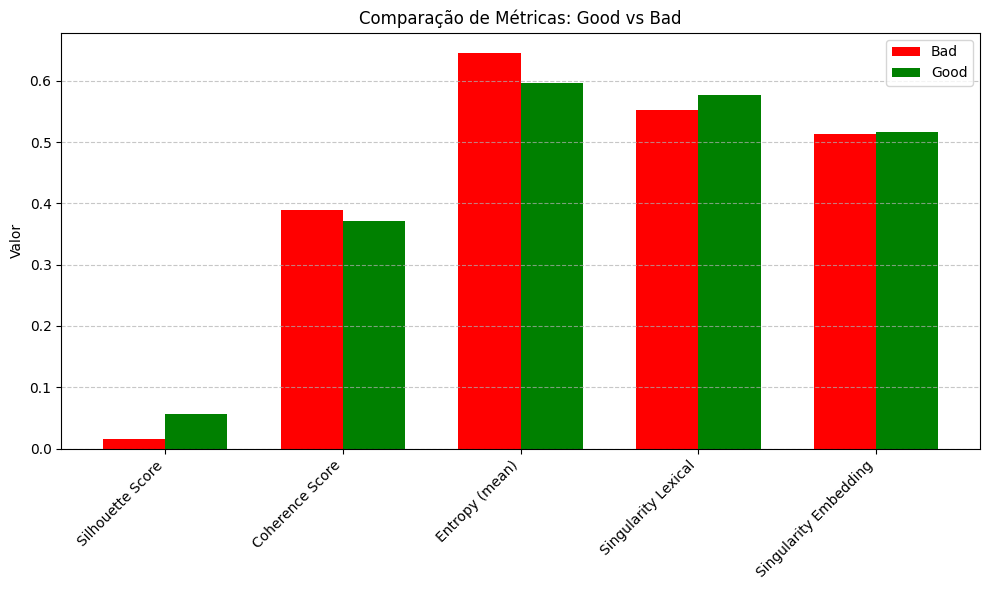

In [ ]:
silhouette_score_bad = 0.0160
silhouette_score_good = 0.0564

coherence_score_bad = 0.3894615837031375
coherence_score_good = 0.3719673360931182

entropy_array_bad = [3.2835, 3.2840, 3.2941, 3.2138, 3.0856, 3.0030, 3.0518, 3.2795, 3.2999, 3.1521]
entropy_array_good = [3.2835, 3.2508, 3.1809, 2.8956, 2.7687]

singularity_score_lexical_bad = 0.552000
singularity_score_lexical_good =0.576000

singularity_score_embedding_bad = 0.512500
singularity_score_embedding_good = 	0.516000

def min_max_normalize(values):
    min_val = min(values)
    max_val = max(values)
    return [(x - min_val) / (max_val - min_val) if max_val != min_val else 0.0 for x in values]

def run_normalization(array):
  array_aux = [0] * len(array)
  for n in range(len(array)):
    array_aux[n] = min_max_normalize(array)
  return array_aux

entropy_array_bad = run_normalization(entropy_array_bad)
entropy_array_good = run_normalization(entropy_array_good)

entropy_mean_bad = np.mean(entropy_array_bad)
entropy_mean_good = np.mean(entropy_array_good)

# Métricas e valores
metric_names = [
    "Silhouette Score",
    "Coherence Score",
    "Entropy (mean)",
    "Singularity Lexical",
    "Singularity Embedding"
]

values_bad = [
    silhouette_score_bad,
    coherence_score_bad,
    entropy_mean_bad,
    singularity_score_lexical_bad,
    singularity_score_embedding_bad
]

values_good = [
    silhouette_score_good,
    coherence_score_good,
    entropy_mean_good,
    singularity_score_lexical_good,
    singularity_score_embedding_good
]

# Gráfico
x = np.arange(len(metric_names))
width = 0.35

fig, ax = plt.subplots(figsize=(10, 6))
bars1 = ax.bar(x - width/2, values_bad, width, label='Bad', color='red')
bars2 = ax.bar(x + width/2, values_good, width, label='Good', color='green')

# Rótulos
ax.set_ylabel('Valor')
ax.set_title('Comparação de Métricas: Good vs Bad')
ax.set_xticks(x)
ax.set_xticklabels(metric_names, rotation=45, ha='right')
ax.legend()
ax.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

#LDA + Evaluation (Tsallis, Renyi, Coherence, Perplexity)

In [ ]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [ ]:
from gensim.utils import simple_preprocess
from gensim.models.ldamodel import LdaModel
import gensim.corpora as corpora
from sklearn.metrics import silhouette_score

In [ ]:
print(docs_folder)

{'simple_docs': [['informação', 'muito', 'complexa', 'específica'], ['linguagem', 'usada'], ['informação', 'complexa'], ['complexidade', 'dos', 'resultados', 'obtidos'], ['pode', 'ser', 'muito', 'técnica', 'e', 'não', 'considerar', 'aspetos', 'sociais'], ['porque', 'o', 'input', 'não', 'é', 'oportuno'], ['os', 'investigadores', 'não', 'querem', 'passar', 'a', 'mensagem'], ['foco', 'nos', 'pormenores', 'falta', 'de', 'abrangência'], ['falta', 'integração', 'ciência', 'sociedade'], ['linguagem', 'inadequada'], ['imagem', 'pouco', 'apelativa'], ['serem', 'inconclusivos'], ['porque', 'a', 'ciência', 'em', 'geral', 'aceita', 'a', 'distinção', 'errada', 'entre', 'valores', 'e', 'factos'], ['falta', 'de', 'intervenção', 'participação', 'dos', 'cientistas'], ['porque', 'a', 'ciência', 'não', 'aparece', 'representada', 'no', 'seu', 'conjunto', 'só', 'por', 'uma', 'visão', 'entre', 'várias'], ['devido', 'à', 'linguagem', 'pouco', 'acessível', 'da', 'ciência', 'ou', 'de', 'alguma', 'ciência'], ['

In [ ]:
from pprint import pprint
from gensim import models
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
from IPython.display import display


def tsallis_entropy(p, q=2.0):
    p = np.array(p)
    return (1 - np.sum(p ** q)) / (q - 1)

def renyi_entropy(p, alpha=2.0):
    p = np.array(p)
    return np.log2(np.sum(p ** alpha)) / (1 - alpha)

def compute_entropy_probs(probs):
    return -np.sum(probs * np.log2(probs + 1e-12))


# def run_lda(docs_folder, num_topics_list = [5,10,15,20], passes = 10, topn =100):
#   pyLDAvis.enable_notebook()

#   for stage, docs in docs_folder.items():
#       for n in num_topics_list:
#         print(f"\n--- LDA for: {stage} {n}---")

#         # Create dictionary and corpus
#         dictionary = corpora.Dictionary(docs)
#         corpus = [dictionary.doc2bow(doc) for doc in docs]

#         # Train LDA model
#         lda_model = models.LdaModel(corpus, num_topics=n, id2word=dictionary, passes=passes)

#         vis_data = gensimvis.prepare(lda_model, corpus, dictionary)
#         display(vis_data)

#         # Display topics

#         log_perplexity = lda_model.log_perplexity(corpus, total_docs=10000)
#         perplexity = np.exp(-log_perplexity)
#         print('Perplexity: ', perplexity)
#         # pprint(lda_model.print_topics())

#         coherence_model_lda = CoherenceModel(model=lda_model, texts=docs, dictionary=dictionary , coherence='c_v')

#         coherence_lda = coherence_model_lda.get_coherence()
#         print('Coherence: ', coherence_lda)

#         print('\nTopic-level Entropies:')
#         for topic_id in range(n):
#             topic_terms = lda_model.get_topic_terms(topicid=topic_id, topn=topn)
#             probs = np.array([prob for _, prob in topic_terms])
#             probs /= probs.sum()  # Normalize

#             tsallis = tsallis_entropy(probs, q=2.0)
#             renyi = renyi_entropy(probs, alpha=2.0)

#             print(f"Topic {topic_id}: Tsallis(q=2) = {tsallis:.4f}, Rényi(α=2) = {renyi:.4f}")



def run_lda(docs_folder, num_topics_list=[5, 10, 15, 20], passes=10, topn=100, save_path="lda_top_words.csv"):
    pyLDAvis.enable_notebook()
    results = []

    for stage, docs in docs_folder.items():
        top_words = []
        for n in num_topics_list:
            print(f"\n--- LDA for: {stage} {n} ---")

            # Create dictionary and corpus
            dictionary = corpora.Dictionary(docs)
            corpus = [dictionary.doc2bow(doc) for doc in docs]

            # Train LDA model
            lda_model = models.LdaModel(corpus, num_topics=n, id2word=dictionary, passes=passes)

            vis_data = gensimvis.prepare(lda_model, corpus, dictionary)
            display(vis_data)

            # Perplexity
            log_perplexity = lda_model.log_perplexity(corpus, total_docs=10000)
            perplexity = np.exp(-log_perplexity)
            print('Perplexity: ', perplexity)

            # Coherence
            coherence_model_lda_umass = CoherenceModel(model=lda_model, texts=docs, dictionary=dictionary, coherence='u_mass')
            coherence_lda_umass = coherence_model_lda_umass.get_coherence()
            print('Coherence umass: ', coherence_lda_umass)

            coherence_model_lda_cv = CoherenceModel(model=lda_model, texts=docs, dictionary=dictionary, coherence='c_v')
            coherence_lda_cv = coherence_model_lda_cv.get_coherence()
            print('Coherence CV: ', coherence_lda_cv)

            # Topic-level entropies + save top words
            print('\nTopic-level Entropies:')
            top_words = []
            for topic_id in range(lda_model.num_topics):
                topic_terms = lda_model.get_topic_terms(topicid=topic_id, topn=10)
                words = [dictionary[word_id] for word_id, _ in topic_terms]
                top_words.append(words)

                tsallis = tsallis_entropy(probs, q=2.0)
                renyi = renyi_entropy(probs, alpha=2.0)
                shannon = compute_entropy_probs(probs)

                print(f"Topic {topic_id}: Tsallis(q=2) = {tsallis:.4f}, Rényi(α=2) = {renyi:.4f}")

            all_doc_topics = [lda_model.get_document_topics(bow, minimum_probability=0) for bow in corpus]
            doc_topic_matrix = np.array([[prob for _, prob in doc] for doc in all_doc_topics])
            labels = np.argmax(doc_topic_matrix, axis=1)

            try:
                silhouette = silhouette_score(doc_topic_matrix, labels, metric="cosine")
            except ValueError:
                silhouette = np.nan  # if only 1 cluster assigned

            print("Silhouette Score:", silhouette)

            # Save top 10 words


            # Save results
            results.append({
                "stage": stage,
                "num_topics": n,
                "perplexity": perplexity,
                "coherence_umass": coherence_lda_umass,
                "coherence_cv": coherence_lda_cv,
                "silhouette": silhouette,
                "top_words": top_words
            })




    #Save results to CSV
    df = pd.DataFrame(results)
    df.to_csv(save_path, index=False)
    print(f"\n✅ Results saved to {save_path}")
    return df

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [ ]:
run_lda(docs_folder)

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag


--- LDA for: simple_docs 5 ---


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replac

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3     -0.110580 -0.094950       1        1  32.310809
0      0.053125 -0.060738       2        1  24.147843
1      0.086184 -0.004664       3        1  17.802399
4      0.053615  0.046580       4        1  13.508751
2     -0.082343  0.113772       5        1  12.230198, topic_info=             Term        Freq       Total Category  logprob  loglift
133   comunicação  135.000000  135.000000  Default  30.0000  30.0000
30             de  558.000000  558.000000  Default  29.0000  29.0000
13            não   93.000000   93.000000  Default  28.0000  28.0000
19              o   96.000000   96.000000  Default  27.0000  27.0000
31          falta   85.000000   85.000000  Default  26.0000  26.0000
...           ...         ...         ...      ...      ...      ...
23              a    8.974686  241.188930   Topic5  -4.9791  -1.1899
12              e    7.780317  200.690585   Topic5  -5.1219  -1.1489
1205        criar    5.902658   53.074682   Topic5  -5.3981  -0.0950
4       linguagem    5.351787   51.069246   Topic5  -5.4960  -0.1545
115          mais    5.040948   44.310814   Topic5  -5.5559  -0.0724

[360 rows x 6 columns], token_table=      Topic      Freq Term
term                      
23        1  0.194868    a
23        2  0.464366    a
23        3  0.194868    a
23        4  0.107799    a
23        5  0.037315    a
...     ...       ...  ...
22        5  0.028477    é
229       1  0.416951    –
229       2  0.128293    –
229       4  0.192439    –
229       5  0.256585    –

[579 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 1, 2, 5, 3])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Perplexity:  837.8195005835483
Coherence umass:  -5.06146964955998


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Coherence CV:  0.3718540332934972

Topic-level Entropies:


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Silhouette Score: 0.90449655

--- LDA for: simple_docs 10 ---


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replac

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.077131 -0.039270       1        1  17.534135
1     -0.067740 -0.069254       2        1  13.565000
2     -0.058044 -0.050730       3        1  13.186801
3     -0.083408  0.111283       4        1  10.742769
6     -0.021202 -0.002838       5        1  10.480189
5      0.022320 -0.084985       6        1   8.537539
4     -0.032977  0.071644       7        1   8.446819
8      0.037178  0.067577       8        1   6.751610
9      0.135160 -0.075221       9        1   6.073727
7      0.145844  0.071795      10        1   4.681412, topic_info=            Term        Freq       Total Category  logprob  loglift
133  comunicação  132.000000  132.000000  Default  30.0000  30.0000
4      linguagem   48.000000   48.000000  Default  29.0000  29.0000
30            de  556.000000  556.000000  Default  28.0000  28.0000
23             a  242.000000  242.000000  Default  27.0000  27.0000
359   interesses   36.000000   36.000000  Default  26.0000  26.0000
..           ...         ...         ...      ...      ...      ...
46            em    2.902816   81.076338  Topic10  -5.1475  -0.2681
41         pouco    1.819940   17.225264  Topic10  -5.6143   0.8140
179    políticos    1.608046   78.824468  Topic10  -5.7381  -0.8306
67            da    1.611736  103.766913  Topic10  -5.7358  -1.1033
117          que    1.579691   58.432922  Topic10  -5.7559  -0.5491

[676 rows x 6 columns], token_table=      Topic      Freq Term
term                      
23        1  0.181310    a
23        2  0.379103    a
23        3  0.078293    a
23        4  0.078293    a
23        5  0.024724    a
...     ...       ...  ...
229       5  0.031125    –
229       6  0.062251    –
229       8  0.031125    –
229      10  0.031125    –
1783      8  0.639758    —

[1234 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 7, 6, 5, 9, 10, 8])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


Perplexity:  817.6060067536409
Coherence umass:  -7.17370200483563


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Coherence CV:  0.37170777278660516

Topic-level Entropies:


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


Silhouette Score: 0.87776977

--- LDA for: simple_docs 15 ---


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
3     -0.094813  0.105752       1        1  9.825036
8      0.082556  0.053894       2        1  9.772493
9     -0.036734  0.094366       3        1  7.754370
5      0.040471 -0.000877       4        1  7.226375
10    -0.097873  0.061948       5        1  7.017453
0      0.007113 -0.053377       6        1  6.916765
4     -0.010685  0.068232       7        1  6.638446
12     0.051614  0.015155       8        1  6.562646
6      0.038521 -0.031610       9        1  6.452668
14     0.095140 -0.068550      10        1  6.043436
1      0.046545 -0.058077      11        1  5.868691
7      0.024849  0.006671      12        1  5.578557
13    -0.019801 -0.045023      13        1  4.902777
2      0.062898 -0.013187      14        1  4.742350
11    -0.189803 -0.135317      15        1  4.697936, topic_info=             Term        Freq       Total Category  logprob  loglift
4       linguagem   47.000000   47.000000  Default  30.0000  30.0000
133   comunicação  129.000000  129.000000  Default  29.0000  29.0000
30             de  554.000000  554.000000  Default  28.0000  28.0000
7             dos   89.000000   89.000000  Default  27.0000  27.0000
12              e  200.000000  200.000000  Default  26.0000  26.0000
...           ...         ...         ...      ...      ...      ...
1628     melhorar    2.026425    7.020805  Topic15  -5.5104   1.8154
67             da    3.580308  102.958782  Topic15  -4.9412  -0.3008
115          mais    2.717749   43.838333  Topic15  -5.2169   0.2773
9      resultados    2.395428   35.591684  Topic15  -5.3431   0.3595
23              a    2.627782  241.158215  Topic15  -5.2505  -1.4613

[1050 rows x 6 columns], token_table=      Topic      Freq Term
term                      
23        1  0.033173    a
23        2  0.161720    a
23        3  0.099520    a
23        4  0.095373    a
23        5  0.053907    a
...     ...       ...  ...
229      10  0.063897    –
229      11  0.031949    –
229      12  0.095846    –
229      14  0.031949    –
229      15  0.063897    –

[1974 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 9, 10, 6, 11, 1, 5, 13, 7, 15, 2, 8, 14, 3, 12])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Perplexity:  798.2947674787359
Coherence umass:  -6.457250426205592


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Coherence CV:  0.366368619789891

Topic-level Entropies:


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Silhouette Score: 0.87402004

--- LDA for: simple_docs 20 ---


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
18    -0.064242  0.056197       1        1  7.697004
5      0.036817  0.000695       2        1  7.456704
6      0.075139 -0.030519       3        1  7.393376
9      0.078045  0.040065       4        1  7.194367
7      0.035436  0.008293       5        1  6.386152
15     0.100105 -0.009827       6        1  6.378488
12     0.057953  0.117434       7        1  5.710354
8      0.010463  0.033663       8        1  5.414659
16     0.065217  0.010543       9        1  4.840042
4      0.050807 -0.131893      10        1  4.836335
19    -0.026046  0.104326      11        1  4.715138
1     -0.018045  0.038059      12        1  4.490259
10     0.028376 -0.076467      13        1  4.338753
2     -0.086762  0.036362      14        1  4.190343
3      0.058665 -0.036946      15        1  3.625098
0     -0.060805  0.074787      16        1  3.388250
11    -0.121927 -0.108139      17        1  3.307987
14    -0.087280 -0.003099      18        1  3.139214
17    -0.104985 -0.012266      19        1  2.951633
13    -0.026932 -0.111269      20        1  2.545846, topic_info=            Term        Freq       Total Category  logprob  loglift
133  comunicação  134.000000  134.000000  Default  30.0000  30.0000
4      linguagem   50.000000   50.000000  Default  29.0000  29.0000
30            de  555.000000  555.000000  Default  28.0000  28.0000
23             a  243.000000  243.000000  Default  27.0000  27.0000
359   interesses   37.000000   37.000000  Default  26.0000  26.0000
..           ...         ...         ...      ...      ...      ...
31         falta    1.496287   83.246299  Topic20  -5.2010  -0.3481
26            os    1.479629  104.871081  Topic20  -5.2122  -0.5902
454          aos    1.475578   26.754368  Topic20  -5.2150   0.7731
74            do    1.452171   68.092907  Topic20  -5.2310  -0.1771
69            ou    1.452163   16.781312  Topic20  -5.2310   1.2235

[1350 rows x 6 columns], token_table=      Topic      Freq Term
term                      
23        1  0.036931    a
23        2  0.102585    a
23        3  0.045137    a
23        4  0.221584    a
23        5  0.024620    a
...     ...       ...  ...
229      19  0.063253    –
1783     12  0.630209    —
361       8  0.210479    …
361       9  0.210479    …
361      15  0.420958    …

[2622 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[19, 6, 7, 10, 8, 16, 13, 9, 17, 5, 20, 2, 11, 3, 4, 1, 12, 15, 18, 14])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Perplexity:  766.0841544293335
Coherence umass:  -9.020699668074421


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Coherence CV:  0.40255637526517496

Topic-level Entropies:


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Silhouette Score: 0.86600024

--- LDA for: normal_docs 5 ---


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2      0.148834  0.055296       1        1  22.775586
4     -0.129030  0.071948       2        1  21.880383
1     -0.000890 -0.133598       3        1  21.118071
0     -0.000098  0.056327       4        1  18.511470
3     -0.018815 -0.049972       5        1  15.714490, topic_info=             Term       Freq      Total Category  logprob  loglift
21          falta  77.000000  77.000000  Default  30.0000  30.0000
3       linguagem  47.000000  47.000000  Default  29.0000  29.0000
146     políticos  73.000000  73.000000  Default  28.0000  28.0000
55      decisores  59.000000  59.000000  Default  27.0000  27.0000
352  stakeholders  24.000000  24.000000  Default  26.0000  26.0000
..            ...        ...        ...      ...      ...      ...
322  investigação   6.060828  35.972258   Topic5  -5.2537   0.0697
108       decisão   4.416654  14.804606   Topic5  -5.5702   0.6410
30          pouco   4.208589  16.469340   Topic5  -5.6184   0.4862
24        ciência   4.693290  95.805146   Topic5  -5.5094  -1.1656
55      decisores   4.432624  59.620386   Topic5  -5.5665  -0.7484

[329 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
671       2  0.879940   abertura
68        2  0.333496   academia
68        3  0.416870   academia
68        4  0.166748   academia
68        5  0.083374   academia
...     ...       ...        ...
1462      5  0.150218  workshops
192       1  0.307223          –
192       3  0.580310          –
192       4  0.034136          –
192       5  0.068272          –

[512 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 5, 2, 1, 4])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Perplexity:  1529.870961896672
Coherence umass:  -13.958284827791804


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Coherence CV:  0.49030153843706675

Topic-level Entropies:


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Silhouette Score: 0.91062486

--- LDA for: normal_docs 10 ---


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
8      0.092600  0.009308       1        1  11.363908
6     -0.033192  0.096080       2        1  11.090139
5     -0.028957 -0.150000       3        1  10.612553
1      0.092435 -0.059429       4        1  10.285482
4     -0.107894  0.047356       5        1  10.086669
9      0.144392  0.005034       6        1  10.067384
0      0.010546  0.033120       7        1  10.026314
2     -0.053825  0.100063       8        1   8.978791
3     -0.004060  0.034829       9        1   8.755207
7     -0.112044 -0.116361      10        1   8.733552, topic_info=            Term        Freq       Total Category  logprob  loglift
104  comunicação  121.000000  121.000000  Default  30.0000  30.0000
173     política   58.000000   58.000000  Default  29.0000  29.0000
24       ciência   95.000000   95.000000  Default  28.0000  28.0000
317   interesses   34.000000   34.000000  Default  27.0000  27.0000
3      linguagem   47.000000   47.000000  Default  26.0000  26.0000
..           ...         ...         ...      ...      ...      ...
288       policy    2.375664   28.498974  Topic10  -5.6028  -0.0466
192            –    2.356145   29.300612  Topic10  -5.6111  -0.0826
79       science    2.331961    9.742333  Topic10  -5.6214   1.0082
151        áreas    2.331940    9.005071  Topic10  -5.6214   1.0869
299          and    2.331939    8.995605  Topic10  -5.6214   1.0880

[594 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
1623      3  0.538982    aberta
1623      8  0.269491    aberta
1637      3  0.895514   abertos
671       1  0.446772  abertura
671       3  0.446772  abertura
...     ...       ...       ...
192       4  0.204774         –
192       5  0.102387         –
192       6  0.068258         –
192       7  0.102387         –
192      10  0.068258         –

[1167 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[9, 7, 6, 2, 5, 10, 1, 3, 4, 8])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Perplexity:  1455.5992919805908
Coherence umass:  -15.054449599357563


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Coherence CV:  0.5205276850855164

Topic-level Entropies:


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Silhouette Score: 0.8993958

--- LDA for: normal_docs 15 ---


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
12    -0.224518 -0.017524       1        1  9.507091
9     -0.001703 -0.142657       2        1  8.694367
3      0.017932  0.061658       3        1  7.567414
13     0.037872 -0.013485       4        1  6.754622
0      0.005381  0.036433       5        1  6.728588
7     -0.002392  0.106444       6        1  6.726580
6      0.002059 -0.017853       7        1  6.473678
2     -0.059828 -0.016173       8        1  6.297382
8      0.028717  0.122971       9        1  6.200796
1     -0.055644 -0.030297      10        1  6.181919
10     0.053077  0.094474      11        1  5.985147
4     -0.061242 -0.008852      12        1  5.966190
5      0.109030 -0.069883      13        1  5.835365
14     0.040364 -0.040738      14        1  5.667773
11     0.110894 -0.064518      15        1  5.413088, topic_info=              Term        Freq       Total Category  logprob  loglift
104    comunicação  123.000000  123.000000  Default   30.000  30.0000
173       política   59.000000   59.000000  Default   29.000  29.0000
21           falta   77.000000   77.000000  Default   28.000  28.0000
317     interesses   35.000000   35.000000  Default   27.000  27.0000
3        linguagem   46.000000   46.000000  Default   26.000  26.0000
...            ...         ...         ...      ...      ...      ...
1154     organizar    1.535446   10.448740  Topic15   -5.561   0.9987
783   competências    1.535444    8.230115  Topic15   -5.561   1.2374
92       problemas    1.535443   10.398111  Topic15   -5.561   1.0035
204   necessidades    1.535443    9.711748  Topic15   -5.561   1.0718
332    importância    1.535442    9.784953  Topic15   -5.561   1.0643

[957 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
1623      5  0.534041      aberta
1623     10  0.267020      aberta
1637      7  0.889017     abertos
2400      5  0.669795       about
63        7  0.888971  abrangente
...     ...       ...         ...
1714     11  0.672489           —
319       8  0.453049           …
319      13  0.226524           …
319      14  0.226524           …
319      15  0.226524           …

[1824 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[13, 10, 4, 14, 1, 8, 7, 3, 9, 2, 11, 5, 6, 15, 12])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Perplexity:  1418.3550308328313
Coherence umass:  -16.217805985220245


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Coherence CV:  0.5583857611382366

Topic-level Entropies:


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Silhouette Score: 0.8760087

--- LDA for: normal_docs 20 ---


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
17     0.171103  0.140404       1        1  8.255496
6     -0.006387  0.152421       2        1  6.603394
19    -0.064812  0.084745       3        1  5.886505
8     -0.034091  0.014980       4        1  5.347757
7     -0.020616  0.020936       5        1  5.337550
0     -0.028831 -0.022145       6        1  5.219212
1     -0.112805 -0.022916       7        1  5.210520
2     -0.158639  0.041623       8        1  5.050919
14    -0.015217  0.057732       9        1  4.980804
16     0.011688 -0.078884      10        1  4.968441
13     0.050901  0.049653      11        1  4.691160
9      0.122952 -0.036666      12        1  4.543202
18    -0.030095  0.018269      13        1  4.523517
11     0.040349 -0.016093      14        1  4.454443
3      0.089913 -0.062365      15        1  4.374348
5      0.027250 -0.074744      16        1  4.373590
12    -0.077550 -0.047454      17        1  4.237561
15     0.021666 -0.103849      18        1  4.017601
10     0.021319 -0.101227      19        1  3.974254
4     -0.008096 -0.014420      20        1  3.949725, topic_info=             Term        Freq       Total Category  logprob  loglift
55      decisores   61.000000   61.000000  Default  30.0000  30.0000
146     políticos   75.000000   75.000000  Default  29.0000  29.0000
3       linguagem   47.000000   47.000000  Default  28.0000  28.0000
104   comunicação  122.000000  122.000000  Default  27.0000  27.0000
326        agenda   27.000000   27.000000  Default  26.0000  26.0000
..            ...         ...         ...      ...      ...      ...
3       linguagem    2.586090   47.571469  Topic20  -4.7245   0.3194
95   conhecimento    1.612184   25.184408  Topic20  -5.1970   0.4829
178        social    1.468763   19.065889  Topic20  -5.2902   0.6680
41   participação    1.468762   14.341455  Topic20  -5.2902   0.9528
248         dados    1.468761   14.108229  Topic20  -5.2902   0.9692

[1261 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
1623      2  0.267210    aberta
1623     14  0.534419    aberta
1623     17  0.267210    aberta
1637     11  0.897314   abertos
671       1  0.856872  abertura
...     ...       ...       ...
192      10  0.102111         –
192      11  0.068074         –
192      15  0.068074         –
192      19  0.034037         –
1714      8  0.662555         —

[2322 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[18, 7, 20, 9, 8, 1, 2, 3, 15, 17, 14, 10, 19, 12, 4, 6, 13, 16, 11, 5])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Perplexity:  1344.4897188689288
Coherence umass:  -16.640817759232547


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Coherence CV:  0.5681066305330218

Topic-level Entropies:


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Silhouette Score: 0.8757769

--- LDA for: no_preprocessing_docs 5 ---


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.044450  0.092552       1        1  27.681091
2      0.025507  0.055236       2        1  22.550617
1      0.008960 -0.045310       3        1  20.931969
3      0.064852 -0.095149       4        1  19.206861
0     -0.143768 -0.007329       5        1   9.629462, topic_info=         Term        Freq       Total Category  logprob  loglift
76         da  101.000000  101.000000  Default  30.0000  30.0000
49          ,  154.000000  154.000000  Default  29.0000  29.0000
33          )  173.000000  173.000000  Default  28.0000  28.0000
32          (  172.000000  172.000000  Default  27.0000  27.0000
27          a  215.000000  215.000000  Default  26.0000  26.0000
..        ...         ...         ...      ...      ...      ...
230  político    3.885916   23.294496   Topic5  -5.6642   0.5495
25          é    4.050438   34.354203   Topic5  -5.6227   0.2024
90         na    4.471965   66.541814   Topic5  -5.5237  -0.3597
192        as    4.112052   47.240705   Topic5  -5.6076  -0.1010
117       com    3.758883  115.971210   Topic5  -5.6974  -1.0889

[362 rows x 6 columns], token_table=      Topic      Freq Term
term                      
136       2  0.805049   ''
136       3  0.191678   ''
32        1  0.619676    (
32        2  0.266403    (
32        3  0.075288    (
...     ...       ...  ...
19        2  0.765640    “
19        4  0.206134    “
20        2  0.765637    ”
20        4  0.206133    ”
403       1  0.812708    …

[571 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 3, 2, 4, 1])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Perplexity:  942.6221206381947
Coherence umass:  -4.8511894575187995


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Coherence CV:  0.3833778974241494

Topic-level Entropies:


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Silhouette Score: 0.9169312

--- LDA for: no_preprocessing_docs 10 ---


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
5     -0.088490 -0.125304       1        1  17.406296
1     -0.004165  0.054672       2        1  14.525633
2     -0.095864 -0.026493       3        1  12.455432
0     -0.120501  0.090212       4        1   9.190034
9      0.082650 -0.061371       5        1   9.131328
4      0.065382 -0.062076       6        1   8.584074
7      0.002447 -0.033096       7        1   7.624677
3     -0.003858  0.070461       8        1   7.308481
6      0.088988  0.008179       9        1   7.123212
8      0.073412  0.084815      10        1   6.650832, topic_info=            Term        Freq       Total Category  logprob  loglift
33             )  174.000000  174.000000  Default  30.0000  30.0000
32             (  173.000000  173.000000  Default  29.0000  29.0000
36            de  548.000000  548.000000  Default  28.0000  28.0000
27             a  212.000000  212.000000  Default  27.0000  27.0000
19             “   33.000000   33.000000  Default  26.0000  26.0000
..           ...         ...         ...      ...      ...      ...
204    políticos    4.314080   71.538907  Topic10  -5.1895  -0.0979
14             e    4.632833  195.930533  Topic10  -5.1183  -1.0342
153  comunicação    3.938305   96.237268  Topic10  -5.2807  -0.4856
76            da    3.271065  101.874143  Topic10  -5.4663  -0.7282
84            do    3.110263   67.158310  Topic10  -5.5167  -0.3619

[703 rows x 6 columns], token_table=      Topic      Freq Term
term                      
136       2  0.469826   ''
136      10  0.508978   ''
32        1  0.712735    (
32        2  0.011496    (
32        3  0.051731    (
...     ...       ...  ...
255      10  0.064744    –
19        1  0.059674    “
19        5  0.895108    “
20        1  0.059674    ”
20        5  0.895104    ”

[1300 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 2, 3, 1, 10, 5, 8, 4, 7, 9])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Perplexity:  891.0873504081352
Coherence umass:  -6.376037424285176


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Coherence CV:  0.37713738230722693

Topic-level Entropies:


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Silhouette Score: 0.89468944

--- LDA for: no_preprocessing_docs 15 ---


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
12     0.131090  0.016892       1        1  12.448788
5     -0.009691  0.063989       2        1  10.089826
10     0.027443 -0.125584       3        1   9.075722
0      0.040930  0.123629       4        1   7.828646
6      0.052535 -0.050248       5        1   7.359414
4      0.057960 -0.022513       6        1   7.059952
13     0.054934  0.049823       7        1   7.059315
8     -0.002448 -0.045498       8        1   6.191279
2      0.039921  0.040816       9        1   6.144944
1     -0.137269  0.078691      10        1   5.094139
7     -0.063389  0.007196      11        1   5.020242
9     -0.041539 -0.037738      12        1   4.942821
3     -0.013286  0.013744      13        1   4.086130
14    -0.094996 -0.025669      14        1   4.070762
11    -0.042195 -0.087530      15        1   3.528021, topic_info=          Term        Freq       Total Category  logprob  loglift
4    Linguagem   27.000000   27.000000  Default  30.0000  30.0000
40       Falta   77.000000   77.000000  Default  29.0000  29.0000
27           a  217.000000  217.000000  Default  28.0000  28.0000
36          de  544.000000  544.000000  Default  27.0000  27.0000
8          dos   86.000000   86.000000  Default  26.0000  26.0000
..         ...         ...         ...      ...      ...      ...
33           )    2.864866  168.110366  Topic15  -4.9649  -0.7277
65          no    2.040251   29.152791  Topic15  -5.3044   0.6850
15         não    2.308384   63.414963  Topic15  -5.1809   0.0313
204  políticos    2.354862   74.011128  Topic15  -5.1609  -0.1033
235   política    2.152370   53.672515  Topic15  -5.2509   0.1281

[1063 rows x 6 columns], token_table=      Topic      Freq Term
term                      
2845      7  0.637065    %
2706      1  0.252459    &
2706      9  0.504919    &
136       3  0.120667   ''
136       6  0.241334   ''
...     ...       ...  ...
20       10  0.059772    ”
20       11  0.119543    ”
20       12  0.029886    ”
20       14  0.149429    ”
20       15  0.029886    ”

[2041 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[13, 6, 11, 1, 7, 5, 14, 9, 3, 2, 8, 10, 4, 15, 12])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Perplexity:  878.4448902786371
Coherence umass:  -6.3801360153697875


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Coherence CV:  0.37905733401432895

Topic-level Entropies:


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Silhouette Score: 0.8926515

--- LDA for: no_preprocessing_docs 20 ---


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
14     0.063445 -0.049502       1        1  8.310717
8      0.100605  0.048174       2        1  8.147433
11     0.131225  0.086912       3        1  8.131804
19     0.083203 -0.079547       4        1  6.719648
1      0.064944  0.051072       5        1  6.580409
4     -0.021870  0.120764       6        1  6.092492
6      0.043195 -0.018364       7        1  5.871455
0      0.029036 -0.047698       8        1  5.347512
17     0.026149 -0.054453       9        1  5.344209
16    -0.059572  0.000470      10        1  4.441616
9     -0.036470 -0.159302      11        1  4.355210
15    -0.064734  0.026774      12        1  4.120783
18     0.036612  0.038359      13        1  3.989645
13     0.007497 -0.048696      14        1  3.851735
7     -0.028388  0.000987      15        1  3.647616
2     -0.006093  0.067250      16        1  3.257051
3     -0.041565 -0.017665      17        1  3.217453
5     -0.166691  0.074388      18        1  3.141270
12    -0.058122 -0.014429      19        1  2.864126
10    -0.102406 -0.025494      20        1  2.567817, topic_info=           Term        Freq       Total Category  logprob  loglift
36           de  553.000000  553.000000  Default  30.0000  30.0000
49            ,  154.000000  154.000000  Default  29.0000  29.0000
40        Falta   80.000000   80.000000  Default  28.0000  28.0000
4     Linguagem   27.000000   27.000000  Default  27.0000  27.0000
511           ;  126.000000  126.000000  Default  26.0000  26.0000
..          ...         ...         ...      ...      ...      ...
400  Interesses    1.190364   17.240183  Topic20  -5.5255   0.9891
70          uma    1.281135   28.699915  Topic20  -5.4520   0.5530
15          não    1.461587   63.859813  Topic20  -5.3202  -0.1151
84           do    1.460288   67.042925  Topic20  -5.3211  -0.1646
117         com    1.560419  115.660475  Topic20  -5.2548  -0.6436

[1354 rows x 6 columns], token_table=      Topic      Freq Term
term                      
701       3  0.617054    !
136       4  0.077346   ''
136       9  0.580095   ''
136      13  0.193365   ''
136      14  0.077346   ''
...     ...       ...  ...
20       17  0.116784    ”
20       18  0.058392    ”
20       20  0.029196    ”
403       1  0.414423    …
403       8  0.414423    …

[2633 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[15, 9, 12, 20, 2, 5, 7, 1, 18, 17, 10, 16, 19, 14, 8, 3, 4, 6, 13, 11])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Perplexity:  843.4885904854006
Coherence umass:  -6.837301524249099


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Coherence CV:  0.3755358574775762

Topic-level Entropies:


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Silhouette Score: 0.8833444

--- LDA for: total_docs 5 ---


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1     -0.031396  0.109772       1        1  25.322575
0     -0.126138  0.028441       2        1  21.216476
2      0.151402  0.060675       3        1  18.835513
3     -0.017061 -0.061114       4        1  18.324716
4      0.023192 -0.137774       5        1  16.300719, topic_info=              Term        Freq       Total Category  logprob  loglift
160       política   62.000000   62.000000  Default  30.0000  30.0000
24         ciência  101.000000  101.000000  Default  29.0000  29.0000
292         agenda   36.000000   36.000000  Default  28.0000  28.0000
21           falta   81.000000   81.000000  Default  27.0000  27.0000
284      interesse   56.000000   56.000000  Default  26.0000  26.0000
...            ...         ...         ...      ...      ...      ...
148          outro    5.305112   11.733723   Topic5  -5.4235   1.0202
744          media    5.502699   14.040822   Topic5  -5.3869   0.8772
409      económico    6.251833   30.219223   Topic5  -5.2593   0.2384
16    investigador    6.346418   33.041046   Topic5  -5.2443   0.1641
1344        evento    5.942842   28.915517   Topic5  -5.3100   0.2318

[326 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
1425      1  0.891457     Brief
1227      1  0.935246    Briefs
1704      1  0.938358    Online
962       3  0.848455        PP
1575      1  0.749855  Strategy
...     ...       ...       ...
175       1  0.131076         –
175       2  0.131076         –
175       3  0.196614         –
175       4  0.163845         –
175       5  0.393228         –

[511 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 1, 3, 4, 5])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Perplexity:  1075.848909225097
Coherence umass:  -12.919224342073893


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Coherence CV:  0.458848620394524

Topic-level Entropies:


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Silhouette Score: 0.89720315

--- LDA for: total_docs 10 ---


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
9     -0.207741 -0.058572       1        1  12.306565
6      0.000746 -0.053105       2        1  10.758554
0      0.025131 -0.102516       3        1  10.572805
3     -0.095962  0.075738       4        1  10.556825
5      0.123182 -0.007689       5        1  10.387997
1      0.019945  0.106406       6        1  10.222982
4     -0.000841  0.163707       7        1  10.123531
7      0.091836 -0.016578       8        1   9.067046
8      0.049428 -0.043766       9        1   8.628144
2     -0.005724 -0.063626      10        1   7.375550, topic_info=             Term        Freq       Total Category  logprob  loglift
99    comunicação  129.000000  129.000000  Default  30.0000  30.0000
284     interesse   55.000000   55.000000  Default  29.0000  29.0000
24        ciência  103.000000  103.000000  Default  28.0000  28.0000
160      política   62.000000   62.000000  Default  27.0000  27.0000
3       linguagem   56.000000   56.000000  Default  26.0000  26.0000
...           ...         ...         ...      ...      ...      ...
166          ação    2.881944   15.705507  Topic10  -5.2407   0.9115
137      político    3.288027  145.638337  Topic10  -5.1088  -1.1838
1081      projeto    2.623958   14.145522  Topic10  -5.3344   0.9223
30          pouco    2.472209   25.926938  Topic10  -5.3940   0.2568
112       impacto    2.452987   20.557386  Topic10  -5.4018   0.4811

[609 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
1911      7  0.637400   Ahead
1227      6  0.160635  Briefs
1227      8  0.160635  Briefs
1227     10  0.562224  Briefs
1253      3  0.632800  Centro
...     ...       ...     ...
175       6  0.097502       –
175       7  0.097502       –
175       8  0.130003       –
175       9  0.097502       –
175      10  0.065001       –

[1198 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[10, 7, 1, 4, 6, 2, 5, 8, 9, 3])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Perplexity:  1071.6664395939238
Coherence umass:  -14.258100917140808


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Coherence CV:  0.5111881010578989

Topic-level Entropies:


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Silhouette Score: 0.87044454

--- LDA for: total_docs 15 ---


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
7     -0.136459 -0.072062       1        1  9.106726
9     -0.082912  0.207276       2        1  7.943872
3     -0.104798 -0.058525       3        1  7.940310
11    -0.043571 -0.020377       4        1  7.637545
14     0.119525  0.077188       5        1  7.186298
12    -0.124917  0.017639       6        1  6.934440
0     -0.013284 -0.049268       7        1  6.800291
2      0.125412 -0.080465       8        1  6.584700
6      0.112971  0.086222       9        1  6.401257
10    -0.014419 -0.062569      10        1  6.320800
1     -0.017396  0.034585      11        1  6.249239
4      0.047246 -0.027439      12        1  6.226883
13     0.037953 -0.067138      13        1  5.441847
5      0.082479 -0.051670      14        1  5.135883
8      0.012169  0.066603      15        1  4.089909, topic_info=            Term        Freq       Total Category  logprob  loglift
99   comunicação  130.000000  130.000000  Default  30.0000  30.0000
21         falta   81.000000   81.000000  Default  29.0000  29.0000
160     política   63.000000   63.000000  Default  28.0000  28.0000
284    interesse   55.000000   55.000000  Default  27.0000  27.0000
3      linguagem   56.000000   56.000000  Default  26.0000  26.0000
..           ...         ...         ...      ...      ...      ...
3      linguagem    1.588546   56.374229  Topic15  -5.2467  -0.3725
409    económico    1.574052   29.875900  Topic15  -5.2558   0.2532
173    evidência    1.547769   13.369922  Topic15  -5.2727   1.0405
446   capacidade    1.547768    6.257880  Topic15  -5.2727   1.7996
87      problema    1.547762   26.689618  Topic15  -5.2727   0.3492

[937 rows x 6 columns], token_table=      Topic      Freq         Term
term                              
1907     13  0.645125       Actors
1911     10  0.633590        Ahead
1405      7  0.634914          Ani
581      12  0.639588  Archaeology
1425      2  0.181198        Brief
...     ...       ...          ...
175       7  0.227145            –
175       8  0.064898            –
175       9  0.064898            –
175      11  0.064898            –
175      13  0.032449            –

[1764 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[8, 10, 4, 12, 15, 13, 1, 3, 7, 11, 2, 5, 14, 6, 9])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Perplexity:  1006.739533096607
Coherence umass:  -14.491550286609586


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Coherence CV:  0.5003220070594276

Topic-level Entropies:


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Silhouette Score: 0.86589086

--- LDA for: total_docs 20 ---


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
19     0.179229  0.081104       1        1  6.922439
5     -0.073083  0.082894       2        1  6.446605
15    -0.062085 -0.098773       3        1  6.264787
2      0.028141 -0.073648       4        1  5.764305
1     -0.066020  0.153299       5        1  5.445069
3     -0.043467 -0.044389       6        1  5.411508
6     -0.095090  0.083213       7        1  5.394578
8      0.008063 -0.097114       8        1  5.393514
14     0.123465  0.017292       9        1  5.199108
11     0.039014  0.065185      10        1  5.165630
7      0.079650 -0.014210      11        1  4.940493
4      0.008369 -0.004303      12        1  4.693368
0      0.011773  0.003381      13        1  4.573970
9     -0.147726  0.005705      14        1  4.507589
17     0.026844 -0.132076      15        1  4.382621
18     0.046617  0.016336      16        1  4.236810
16    -0.014201 -0.110047      17        1  4.102845
13    -0.070554 -0.017683      18        1  4.077719
12    -0.005529  0.019109      19        1  3.719510
10     0.026591  0.064723      20        1  3.357534, topic_info=             Term        Freq       Total Category  logprob  loglift
99    comunicação  130.000000  130.000000  Default  30.0000  30.0000
11         social   35.000000   35.000000  Default  29.0000  29.0000
110         criar   54.000000   54.000000  Default  28.0000  28.0000
1344       evento   28.000000   28.000000  Default  27.0000  27.0000
256        policy   29.000000   29.000000  Default  26.0000  26.0000
...           ...         ...         ...      ...      ...      ...
110         criar    1.939663   54.820588  Topic20  -4.8496   0.0524
137      político    2.031008  145.889939  Topic20  -4.8036  -0.8804
213      trabalho    1.609609   18.939232  Topic20  -5.0362   0.9287
3       linguagem    1.477934   56.436052  Topic20  -5.1215  -0.2485
97        público    1.451529   74.813159  Topic20  -5.1395  -0.5484

[1225 rows x 6 columns], token_table=      Topic      Freq         Term
term                              
1927      2  0.633450        About
1907      4  0.624360       Actors
1911     15  0.643276        Ahead
1405     14  0.636044          Ani
581       8  0.636633  Archaeology
...     ...       ...          ...
175      12  0.162020            –
175      18  0.097212            –
175      19  0.064808            –
175      20  0.032404            –
1413     14  0.636043            —

[2263 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[20, 6, 16, 3, 2, 4, 7, 9, 15, 12, 8, 5, 1, 10, 18, 19, 17, 14, 13, 11])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


Perplexity:  1015.5141715517707
Coherence umass:  -14.906098936275493


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Coherence CV:  0.5114342919398327

Topic-level Entropies:


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


Silhouette Score: 0.83836323

--- LDA for: pt_total_preprocessing_docs 5 ---


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.050229 -0.165929       1        1  24.032257
1     -0.175699 -0.001445       2        1  21.166922
2      0.054159  0.044812       3        1  20.590666
0      0.068457  0.080845       4        1  17.167359
3      0.002854  0.041718       5        1  17.042796, topic_info=            Term        Freq       Total Category  logprob  loglift
99   comunicação  132.000000  132.000000  Default  30.0000  30.0000
24       ciência  107.000000  107.000000  Default  29.0000  29.0000
97       público   76.000000   76.000000  Default  28.0000  28.0000
160     política   68.000000   68.000000  Default  27.0000  27.0000
3      linguagem   56.000000   56.000000  Default  26.0000  26.0000
..           ...         ...         ...      ...      ...      ...
55       decisor    7.886619   70.605137   Topic5  -5.0827  -0.4225
21         falta    7.106810   84.197768   Topic5  -5.1868  -0.7027
160     política    6.656421   68.397030   Topic5  -5.2523  -0.5603
24       ciência    6.993180  107.665439   Topic5  -5.2029  -0.9647
103      decisão    5.785408   22.027525   Topic5  -5.3925   0.4325

[337 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
1215      2  0.626230   Briefs
1215      3  0.268384   Briefs
1120      3  0.213356  Brokers
1120      4  0.640067  Brokers
1688      3  0.948427   Online
...     ...       ...      ...
175       2  0.032754        –
175       3  0.032754        –
175       4  0.524070        –
175       5  0.131017        –
283       2  0.832604        …

[528 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 2, 3, 1, 4])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Perplexity:  1060.6858769998028
Coherence umass:  -12.875407858001427


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


Coherence CV:  0.4555770565970644

Topic-level Entropies:


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Silhouette Score: 0.89459103

--- LDA for: pt_total_preprocessing_docs 10 ---


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
5      0.103197  0.126718       1        1  14.107944
0      0.043089  0.109073       2        1  12.483282
4      0.188031 -0.038565       3        1  11.174509
6     -0.055168  0.008124       4        1   9.994929
2     -0.008204 -0.037509       5        1   9.616973
3      0.052923 -0.158432       6        1   9.065798
9     -0.056999 -0.088535       7        1   8.809574
7     -0.084403  0.043267       8        1   8.765491
1     -0.088860 -0.008068       9        1   8.586587
8     -0.093606  0.043926      10        1   7.394913, topic_info=            Term        Freq       Total Category  logprob  loglift
99   comunicação  133.000000  133.000000  Default  30.0000  30.0000
3      linguagem   57.000000   57.000000  Default  29.0000  29.0000
160     política   69.000000   69.000000  Default  28.0000  28.0000
281    interesse   56.000000   56.000000  Default  27.0000  27.0000
21         falta   84.000000   84.000000  Default  26.0000  26.0000
..           ...         ...         ...      ...      ...      ...
143    diferente    3.359775   32.382275  Topic10  -5.1011   0.3386
50    científico    3.491115   66.477534  Topic10  -5.0627  -0.3423
148        outro    2.564095   13.418405  Topic10  -5.3713   0.9494
39     cientista    2.506006   28.503809  Topic10  -5.3942   0.1730
98           ter    2.410983   13.414491  Topic10  -5.4329   0.8881

[606 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
804       5  0.629871       .
1215      2  0.448525  Briefs
1215      3  0.448525  Briefs
1243      1  0.157931  Centro
1243      4  0.631725  Centro
...     ...       ...     ...
175       7  0.161928       –
175       8  0.032386       –
283       3  0.210537       …
283       5  0.421073       …
283      10  0.210537       …

[1137 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 1, 5, 7, 3, 4, 10, 8, 2, 9])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Perplexity:  1028.4291209197384
Coherence umass:  -13.616127337237838


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Coherence CV:  0.4686228589993006

Topic-level Entropies:


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Silhouette Score: 0.8658131

--- LDA for: pt_total_preprocessing_docs 15 ---


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
14     0.147440 -0.046907       1        1  8.667491
6      0.030152 -0.031299       2        1  8.385979
10    -0.040036  0.157202       3        1  7.500474
3     -0.053420  0.097359       4        1  7.473245
8      0.075840  0.057969       5        1  7.279070
9      0.046903  0.089498       6        1  7.195250
7     -0.079822  0.052120       7        1  6.834749
5      0.073123 -0.042676       8        1  6.714862
11    -0.121073 -0.060639       9        1  6.468498
4     -0.105259 -0.064581      10        1  6.146727
13     0.075875 -0.091483      11        1  6.012863
0     -0.044547 -0.074514      12        1  5.937055
12     0.084800  0.032428      13        1  5.699681
2     -0.029689  0.009279      14        1  5.271310
1     -0.060286 -0.083757      15        1  4.412746, topic_info=            Term        Freq       Total Category  logprob  loglift
99   comunicação  134.000000  134.000000  Default  30.0000  30.0000
3      linguagem   55.000000   55.000000  Default  29.0000  29.0000
281    interesse   56.000000   56.000000  Default  28.0000  28.0000
21         falta   84.000000   84.000000  Default  27.0000  27.0000
24       ciência  109.000000  109.000000  Default  26.0000  26.0000
..           ...         ...         ...      ...      ...      ...
137     político    1.625641  145.172882  Topic15  -5.3107  -1.3713
38         valor    1.584271    8.697263  Topic15  -5.3365   1.4178
102      solução    1.584270   16.583176  Topic15  -5.3365   0.7724
342      assunto    1.584267    9.433127  Topic15  -5.3365   1.3366
100        forma    1.584266   24.385909  Topic15  -5.3365   0.3868

[956 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
804      12  0.635628       .
580      11  0.632067       A
1396      8  0.634752     Ani
1215      6  0.896087  Briefs
1243      2  0.469719  Centro
...     ...       ...     ...
175      12  0.064310       –
175      14  0.064310       –
1401      8  0.634752       —
283       8  0.424661       …
283      13  0.424661       …

[1877 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[15, 7, 11, 4, 9, 10, 8, 6, 12, 5, 14, 1, 13, 3, 2])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Perplexity:  1026.300608567884
Coherence umass:  -14.235036693893246


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Coherence CV:  0.5014088017003662

Topic-level Entropies:


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Silhouette Score: 0.8698675

--- LDA for: pt_total_preprocessing_docs 20 ---


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
19     0.122251  0.068926       1        1  7.109735
11    -0.083185 -0.113037       2        1  6.674843
9      0.101221 -0.094676       3        1  6.464644
13    -0.091101 -0.095224       4        1  6.460912
3      0.077800  0.017086       5        1  5.661558
6      0.030682 -0.032138       6        1  5.407484
0      0.104840  0.017779       7        1  5.308538
5     -0.077934  0.028450       8        1  5.282897
2      0.146649 -0.006103       9        1  5.168602
15     0.026876  0.156852      10        1  4.798392
7     -0.034931 -0.078109      11        1  4.589877
18    -0.018892  0.000606      12        1  4.544520
8     -0.063124  0.027061      13        1  4.411943
4     -0.013859 -0.002799      14        1  4.332403
16    -0.130948  0.083185      15        1  4.303456
14     0.023908 -0.095916      16        1  4.279960
10    -0.075140 -0.066148      17        1  4.079528
17     0.015301  0.051388      18        1  4.000690
12     0.035135 -0.008872      19        1  3.699310
1     -0.095550  0.141689      20        1  3.420709, topic_info=            Term        Freq       Total Category  logprob  loglift
3      linguagem   56.000000   56.000000  Default  30.0000  30.0000
99   comunicação  133.000000  133.000000  Default  29.0000  29.0000
137     político  145.000000  145.000000  Default  28.0000  28.0000
281    interesse   55.000000   55.000000  Default  27.0000  27.0000
50    científico   67.000000   67.000000  Default  26.0000  26.0000
..           ...         ...         ...      ...      ...      ...
112      impacto    1.780509   22.128000  Topic20  -4.9651   0.8554
283            …    1.073610    4.673877  Topic20  -5.4710   1.9044
21         falta    2.088225   84.924877  Topic20  -4.8057  -0.3301
11        social    1.586519   36.207457  Topic20  -5.0804   0.2476
24       ciência    1.754403  108.434965  Topic20  -4.9799  -0.7487

[1272 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
804      18  0.634498        .
580       6  0.628636        A
1396     12  0.634438      Ani
72       14  0.639173  Believe
1685      8  0.633522    Breve
...     ...       ...      ...
1401     12  0.634438        —
283      10  0.213955        …
283      14  0.427910        …
283      17  0.213955        …
283      20  0.213955        …

[2404 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[20, 12, 10, 14, 4, 7, 1, 6, 3, 16, 8, 19, 9, 5, 17, 15, 11, 18, 13, 2])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Perplexity:  1007.4619966370839
Coherence umass:  -15.013419098516252


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Coherence CV:  0.5143170474445854

Topic-level Entropies:


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Silhouette Score: 0.8425273

--- LDA for: pt_normal_preprocessing_docs 5 ---


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2      0.025568  0.095472       1        1  22.296916
3      0.046060 -0.082043       2        1  20.816430
1      0.119975  0.027985       3        1  20.235634
4     -0.132199  0.061539       4        1  18.440000
0     -0.059404 -0.102952       5        1  18.211021, topic_info=              Term        Freq       Total Category  logprob  loglift
104    comunicação  126.000000  126.000000  Default  30.0000  30.0000
1114         criar   50.000000   50.000000  Default  29.0000  29.0000
3        linguagem   47.000000   47.000000  Default  28.0000  28.0000
309     interesses   34.000000   34.000000  Default  27.0000  27.0000
121      comunicar   21.000000   21.000000  Default  26.0000  26.0000
...            ...         ...         ...      ...      ...      ...
204   necessidades    4.692152   11.290161   Topic5  -5.6672   0.8251
313   investigação    6.129583   37.855413   Topic5  -5.4000  -0.1175
192              –    5.413941   29.515355   Topic5  -5.5241   0.0072
173       política    4.795386   62.791936   Topic5  -5.6454  -0.8690
1590       eventos    4.719672   26.542750   Topic5  -5.6614  -0.0239

[340 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
936       2  0.874584        ,
1588      2  0.787479   aberta
1602      5  0.883838  abertos
60        2  0.657336   acesso
60        5  0.219112   acesso
...     ...       ...      ...
192       1  0.271045        –
192       2  0.338807        –
192       3  0.135523        –
192       4  0.067761        –
192       5  0.169403        –

[517 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 4, 2, 5, 1])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Perplexity:  1439.7209701672557
Coherence umass:  -13.939851060896384


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Coherence CV:  0.48744055822659077

Topic-level Entropies:


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Silhouette Score: 0.9195581

--- LDA for: pt_normal_preprocessing_docs 10 ---


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.015021 -0.146081       1        1  11.753102
8     -0.023633  0.078075       2        1  11.294039
7     -0.090379  0.040309       3        1  11.142313
2     -0.124016 -0.094987       4        1  10.501676
9      0.088161  0.041945       5        1  10.300490
6     -0.110169  0.055150       6        1  10.141419
5      0.060979 -0.061084       7        1   9.142122
0      0.057264  0.068611       8        1   8.961221
3      0.087636 -0.054236       9        1   8.496400
1      0.039136  0.072297      10        1   8.267218, topic_info=            Term       Freq       Total Category  logprob  loglift
21         falta  80.000000   80.000000  Default  30.0000  30.0000
3      linguagem  48.000000   48.000000  Default  29.0000  29.0000
317       agenda  27.000000   27.000000  Default  28.0000  28.0000
55     decisores  61.000000   61.000000  Default  27.0000  27.0000
309   interesses  35.000000   35.000000  Default  26.0000  26.0000
...          ...        ...         ...      ...      ...      ...
26     sociedade   3.045345   19.586306  Topic10  -5.3098   0.6317
1590     eventos   2.964670   26.767915  Topic10  -5.3366   0.2924
263     públicas   2.748264   21.212283  Topic10  -5.4124   0.4493
24       ciência   2.525102  101.226697  Topic10  -5.4971  -1.1982
119   científica   2.322325   29.428822  Topic10  -5.5808  -0.0465

[605 rows x 6 columns], token_table=      Topic      Freq Term
term                      
936       1  0.650298    ,
936       4  0.216766    ,
282       8  0.445506    a
282       9  0.297004    a
282      10  0.148502    a
...     ...       ...  ...
192       5  0.067685    –
192       6  0.169211    –
192       8  0.033842    –
192       9  0.067685    –
192      10  0.067685    –

[1141 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 9, 8, 3, 10, 7, 6, 1, 4, 2])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Perplexity:  1392.5428533872578
Coherence umass:  -15.09936002892257


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Coherence CV:  0.5191647115391281

Topic-level Entropies:


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Silhouette Score: 0.9047749

--- LDA for: pt_normal_preprocessing_docs 15 ---


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
13     0.082640 -0.044869       1        1  9.945622
0      0.152844  0.021213       2        1  8.642240
8     -0.004950  0.048544       3        1  7.915084
2     -0.044640  0.114537       4        1  7.770186
14     0.103859  0.037384       5        1  7.287736
9      0.030358 -0.097833       6        1  6.768567
4      0.096414 -0.038029       7        1  6.381497
11    -0.022440 -0.124498       8        1  6.247244
1     -0.056432 -0.088905       9        1  6.081948
6     -0.066096  0.003070      10        1  5.855740
3     -0.095711 -0.020203      11        1  5.673240
12    -0.006697  0.098591      12        1  5.596153
10    -0.092281 -0.054632      13        1  5.526247
5     -0.034341  0.102987      14        1  5.484908
7     -0.042526  0.042641      15        1  4.823589, topic_info=             Term        Freq       Total Category  logprob  loglift
7      resultados   35.000000   35.000000  Default  30.0000  30.0000
3       linguagem   48.000000   48.000000  Default  29.0000  29.0000
1590      eventos   26.000000   26.000000  Default  28.0000  28.0000
309    interesses   34.000000   34.000000  Default  27.0000  27.0000
104   comunicação  128.000000  128.000000  Default  26.0000  26.0000
...           ...         ...         ...      ...      ...      ...
116       impacto    2.591827   18.014457  Topic15  -4.9322   1.0928
24        ciência    3.862473  101.604745  Topic15  -4.5333  -0.2381
173      política    2.996844   63.292509  Topic15  -4.7870  -0.0186
178        social    2.194958   18.920436  Topic15  -5.0984   0.8776
26      sociedade    1.787634   19.816899  Topic15  -5.3037   0.6260

[960 rows x 6 columns], token_table=      Topic      Freq Term
term                      
936       4  0.656082    ,
936       6  0.218694    ,
937       4  0.658684    .
282       1  0.294053    a
282       3  0.147027    a
...     ...       ...  ...
192       8  0.033835    –
192       9  0.135340    –
192      11  0.067670    –
192      13  0.169175    –
1673     11  0.670348    —

[1837 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[14, 1, 9, 3, 15, 10, 5, 12, 2, 7, 4, 13, 11, 6, 8])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Perplexity:  1355.6667263424927
Coherence umass:  -15.34572638822078


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Coherence CV:  0.5311718755795897

Topic-level Entropies:


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Silhouette Score: 0.89101964

--- LDA for: pt_normal_preprocessing_docs 20 ---


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
1      0.080057  0.137222       1        1  6.798061
2      0.176499 -0.079989       2        1  6.658435
4      0.085696  0.056743       3        1  6.176817
5      0.037490  0.045544       4        1  6.127407
3     -0.030708  0.161347       5        1  5.825119
6      0.058268 -0.087781       6        1  5.195601
7      0.079144 -0.072938       7        1  5.111637
9      0.011864 -0.004827       8        1  5.070508
0     -0.055403  0.048338       9        1  5.063346
8      0.031721 -0.032961      10        1  5.007843
12    -0.083141  0.013494      11        1  4.846032
13    -0.070326 -0.091319      12        1  4.661798
15    -0.146759 -0.021212      13        1  4.495967
11     0.058245 -0.047075      14        1  4.447568
17     0.017170  0.000056      15        1  4.341635
14    -0.048132  0.051750      16        1  4.269471
19    -0.096888 -0.045275      17        1  4.173007
16    -0.032840 -0.013717      18        1  3.943472
10     0.012157  0.069627      19        1  3.927870
18    -0.084115 -0.087028      20        1  3.858407, topic_info=             Term        Freq       Total Category  logprob  loglift
104   comunicação  127.000000  127.000000  Default  30.0000  30.0000
3       linguagem   47.000000   47.000000  Default  29.0000  29.0000
21          falta   82.000000   82.000000  Default  28.0000  28.0000
309    interesses   34.000000   34.000000  Default  27.0000  27.0000
7      resultados   34.000000   34.000000  Default  26.0000  26.0000
..            ...         ...         ...      ...      ...      ...
195        inputs    1.494752    9.053684  Topic20  -5.2594   1.4537
351     políticas    1.588241   53.634864  Topic20  -5.1987  -0.2647
894       criação    1.501243   18.761886  Topic20  -5.2550   0.7294
648        policy    1.501241   22.900970  Topic20  -5.2550   0.5300
343  stakeholders    1.501224   24.051614  Topic20  -5.2550   0.4810

[1254 rows x 6 columns], token_table=      Topic      Freq Term
term                      
936      10  0.659235    ,
936      18  0.219745    ,
937      10  0.658981    .
282       1  0.146907    a
282       6  0.146907    a
...     ...       ...  ...
192      16  0.034283    –
192      17  0.137131    –
192      18  0.034283    –
192      19  0.034283    –
1673      3  0.649185    —

[2296 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 3, 5, 6, 4, 7, 8, 10, 1, 9, 13, 14, 16, 12, 18, 15, 20, 17, 11, 19])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Perplexity:  1273.1010672947589
Coherence umass:  -16.51886419222418


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Coherence CV:  0.5644774161023112

Topic-level Entropies:


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Silhouette Score: 0.86094236

✅ Results saved to lda_top_words.csv


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,stage,num_topics,perplexity,coherence_umass,coherence_cv,silhouette,top_words
0,simple_docs,5,837.819501,-5.061470,0.371854,0.904497,"[[de, a, e, políticos, não, dos, os, que, inte..."
1,simple_docs,10,817.606007,-7.173702,0.371708,0.877770,"[[de, a, e, da, para, com, não, o, ciência, fa..."
2,simple_docs,15,798.294767,-6.457250,0.366369,0.874020,"[[de, interesses, políticos, conhecimento, não..."
3,simple_docs,20,766.084154,-9.020700,0.402556,0.866000,"[[de, dos, criar, falta, na, envolvimento, nos..."
4,normal_docs,5,1529.870962,-13.958285,0.490302,0.910625,"[[stakeholders, ciência, comunicação, diferent..."
5,normal_docs,10,1455.599292,-15.054450,0.520528,0.899396,"[[ciência, criar, envolver, grupos, políticas,..."
6,normal_docs,15,1418.355031,-16.217806,0.558386,0.876009,"[[políticas, ciência, sempre, foco, político, ..."
7,normal_docs,20,1344.489719,-16.640818,0.568107,0.875777,"[[co, ciência, mensagem, criação, criar, ativa..."
8,no_preprocessing_docs,5,942.622121,-4.851189,0.383378,0.916931,"[[de, ;, ,, que, comunicação, Criar, políticas..."
9,no_preprocessing_docs,10,891.087350,-6.376037,0.377137,0.894689,"[[de, comunicação, Falta, em, na, dos, polític..."


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
